# EY Data Science Challenge 2025 - Submission Assessment - John Bergmann
Here, I summarize my solution approach, from dataset exploration and feature selection to model interpretability. All experiments were conducted on a system with 32GB of RAM and a CPU with 32 logical (16 physical) cores. No GPU acceleration was required to train any models. All sources used (datasets, models, libraries) are openly accessible.
***
This Notebook is divided into 5 main parts:
1) Data Sources
    - Datasets used (including sources)
    - Preprocessing

2) Feature Engineering
    - Methodology
    - Performance enhancements

3) Feature Selection
    - 58 features is all you need 😎

3) Model Training
    - Training Pipeline
    - Reducing prediction bias

4) Feature Importance
    - SHAP Plots
    - Inspecting Single Features
***

# Setup - Imports, Competition Data, Constants

In [91]:
# Imports required for this notebook

# Generic Data Wrangling
import pandas as pd
import geopandas as gpd
import numpy as np

# Geospatial Libraries
import pystac_client
import planetary_computer 
from odc.stac import stac_load
import rasterio
import rioxarray as rio

# Machine Learning Utilities
from sklearn.ensemble import VotingRegressor, ExtraTreesRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import KFold, cross_val_score
import shap
shap.initjs()

# I/O and Visualization
import gc
import os
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import joblib

# Silence warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Constant variables
NY_LOW_LEFT = (40.75, -74.01)
NY_UP_RIGHT = (40.88, -73.86)
NY_BBOX = (NY_LOW_LEFT[1], NY_LOW_LEFT[0], NY_UP_RIGHT[1], NY_UP_RIGHT[0])

# Set Random Seeds for reproducibility
SEED = 42
np.random.seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)

In [3]:
# Load competition data
train = pd.read_csv("./DATA/train.csv")
train["datetime"] = pd.to_datetime(train["datetime"], format="%d-%m-%Y %H:%M").dt.floor("min")

test = pd.read_csv("./DATA/test.csv")
submission = pd.read_csv("./DATA/test.csv")

train.head()

,Longitude,Latitude,datetime,UHI Index
0,-73.909167,40.813107,2021-07-24 15:53:00,1.030289
1,-73.909187,40.813045,2021-07-24 15:53:00,1.030289
2,-73.909215,40.812978,2021-07-24 15:53:00,1.023798
3,-73.909242,40.812908,2021-07-24 15:53:00,1.023798
4,-73.909257,40.812845,2021-07-24 15:53:00,1.021634


# 1) Data Sources

For all data sources used, three important considerations were made:
- The datasets are open source (in line with the competition guidelines)
- The datasets are being actively maintained and will be available in the future, enabling scaling of the solution
- No data leakage is introduced in the datasets. Data leakage refers to the act of using data to train a model that it cant possibly have access to at prediction time. For example, using building footprints from 2024 to train on our data, which is from 2021.

## Building Footprints
Building footprints allow the model to make sense of the urban environment it is currently situated in. If there are many tall buildings, they might restrict cooling effects like air-flow. Similarly, if buildings are old, it might indicate poor emissions, which can heat up the city and lead to Urban Heat Islands (UHIs).

Building data has been downloaded from the official NewYorkCity data page in geojson format using the "Export" button (this allows easy reading of the data using geopandas):

https://data.cityofnewyork.us/City-Government/Building-Footprints/5zhs-2jue/about_data

We proceed to load the building data and filter out any building footprint entries after June 2021 to avoid any data leakage. Since the dataset is updated weekly, we are extra safe and even have a buffer. After that, we remove features that are not needed, clip the data to the competition geo-space, plot the data, and save to disk.

In [4]:
buildings = gpd.read_file("./DATA/raw/Building Footprints_20250122.geojson", crs=4326).astype({
    "heightroof": float,
    "cnstrct_yr": float,
    "groundelev": float,
    "feat_code": float,
})
buildings["lstmoddate"] = pd.to_datetime(buildings["lstmoddate"], format="%Y-%m-%d")
buildings = buildings.loc[(buildings["lstmoddate"] <= "2021-06-30") & (buildings["cnstrct_yr"] <= 2021)].sort_values(["lstmoddate", "cnstrct_yr"], ascending=False)
buildings = buildings[["heightroof", "cnstrct_yr", "groundelev", "feat_code", "geometry"]].reset_index(drop=True)
buildings.head()

,heightroof,cnstrct_yr,groundelev,feat_code,geometry
0,25.0,2021.0,305.0,2100.0,"MULTIPOLYGON (((-74.12399 40.59989, -74.12382 ..."
1,25.0,2021.0,303.0,2100.0,"MULTIPOLYGON (((-74.12382 40.5999, -74.12399 4..."
2,32.0,2021.0,304.0,2100.0,"MULTIPOLYGON (((-74.12395 40.59968, -74.12382 ..."
3,25.0,2021.0,305.0,2100.0,"MULTIPOLYGON (((-74.12397 40.59975, -74.12382 ..."
4,25.0,2021.0,304.0,2100.0,"MULTIPOLYGON (((-74.12382 40.59976, -74.12397 ..."


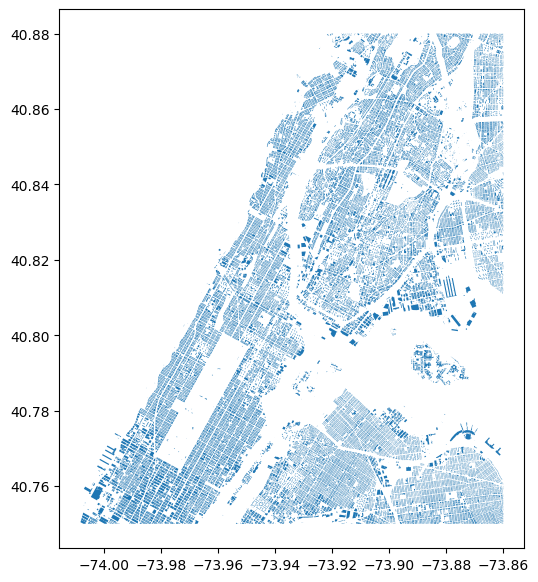

In [5]:
# Clip building data to New York City bounding box to reduce file size / memory usage
buildings = buildings.clip(NY_BBOX)
# Visualize the building footprints
buildings.plot(figsize=(6, 8));

In [6]:
# Save the clipped building data for later use in feature engineering
buildings.to_file("./DATA/processed/ny_buildings.geojson", driver="GeoJSON")

## Cooling Tower Registrations
Cooling towers in new york usually indicate that a building is using air-conditioning. Of course, there are also industrial applications and other uses. Ultimatelly, it all comes down to cooling towers installed on a building indicating, that something in the building is being cooled down. A model can use such features as direct heat indicators. Air conditioning itself might cool down an area, however the steam produced from cooling towers might increase the temperature outside the building, leading to UHIs.

Cooling tower data has been downloaded from the official NewYorkCity data page in csv format using the "Export" button:

https://data.cityofnewyork.us/Health/NYC-Cooling-Tower-Registrations/y4fw-iqfr/about_data

We proceed to load the cooling tower data and filter out any entries after June 2021 to avoid any data leakage. Since the dataset is updated daily, we are extra safe and even have a buffer. After that, we remove features that are not needed, clip the data to the competition geo-space, plot the data, and save to disk.

In [7]:
cooltowers = pd.read_csv("./DATA/raw/NYC_Cooling_Tower_Registrations_20250218.csv")
cooltowers["Date_Registered"] = pd.to_datetime(cooltowers["Date_Registered"], format="%Y-%m-%d")
cooltowers = cooltowers.loc[cooltowers["Date_Registered"] < "2021-07-01"]
cooltowers = gpd.GeoDataFrame(cooltowers, geometry=gpd.points_from_xy(cooltowers.Longitude, cooltowers.Latitude), crs=4326)
# We only keep the number of cooling towers and the geometry
cooltowers = cooltowers[["Active_Equip", "geometry"]]
cooltowers.head()

,Active_Equip,geometry
0,1,POINT (-74.00623 40.70771)
1,1,POINT (-74.0072 40.70835)
2,1,POINT (-74.0006 40.71793)
3,3,POINT (-73.98634 40.75273)
4,1,POINT (-73.98579 40.74784)


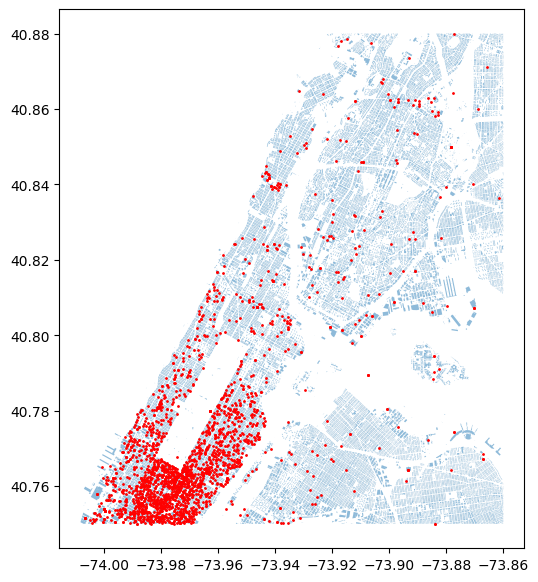

In [8]:
# Clip cooltower data to New York City bounding box to reduce file size / memory usage
cooltowers = cooltowers.clip(NY_BBOX)
# Visualize the cooling tower locations on building footprints (they provide a nice pseudo-grid of the city)
fig, ax = plt.subplots(figsize=(6, 8))
buildings.plot(ax=ax, alpha=0.5)
cooltowers.plot(ax=ax, color="red", markersize=1)
plt.show()

In [9]:
# Save the clipped cooltower data for later use in feature engineering
cooltowers.to_file("./DATA/processed/ny_cooltowers.geojson", driver="GeoJSON")

## Air Quality
While air quality is not usually seen as a direct cause of UHIs, it is very evidently an indicator of such. 


There are many publications covering this such as:
- https://pmc.ncbi.nlm.nih.gov/articles/PMC7434321/
- https://www.sciencedirect.com/science/article/pii/S1470160X21006415
- https://www.sciencedirect.com/science/article/abs/pii/S2213305424000109

Citing one of the papers, "generally, both synergistic and antagonistic interactions are established depending on the considered class of pollutants". Since UHI are linked to worse (air) pollution (and possibly vice-versa, this is for the model to explore), the later can be a helpful indicator for our models. One objective is predicting the impact of UHI but one also has to "find" them in noisy data. Therefore, if the model figures out bad air quality is a strong indicator for UHIs, this can help the city locate UHIs and deal with them accordingly.

Air quality data has been downloaded from the official NewYorkCity data page in csv format using the "Export" button:

https://data.cityofnewyork.us/Environment/Air-Quality/c3uy-2p5r/about_data

We proceed to load the data and filtering to the CD GeoType, which indicates a NewYorkCity Community District (CD). Community Districts are more granular/detailed areas than boroughs and should allow us to build more meaningful features later. 

The following image shows a map of the CDs that are in the competition area (source: https://www.nyc.gov/assets/planning/download/pdf/about/publications/maps/nyc-community-districts-map.pdf)

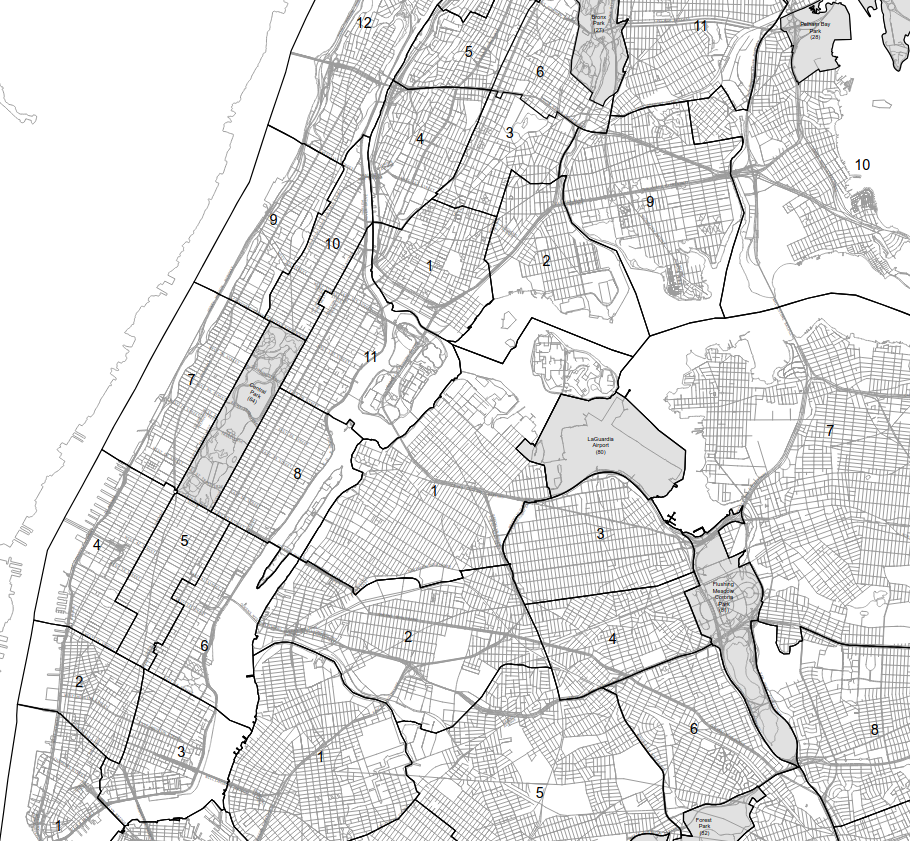

Data that is too general (for example for the entire borough of Manhattan) is likely going to end up as noise in the models instead of a useful predictor. Again, to make sure we don´t introduce data leakage, data is filtered to include only Winter 2019/20, Annual Average 2020, and Summer 2020.

In [10]:
airquality = pd.read_csv("./DATA/raw/Air_Quality_20250218.csv").rename(columns={"Geo Join ID": "GEOCODE"})
airquality["Start_Date"] = pd.to_datetime(airquality["Start_Date"])
airquality = airquality.loc[airquality["Geo Type Name"] == "CD"]
airquality["Indicator_Str"] = airquality["Name"] + "_" + airquality["Measure"] + "_" + airquality["Measure Info"]
airquality = airquality.drop(columns=["Name", "Measure", "Measure Info", "Message", "Unique ID"])
airquality = airquality.loc[airquality["Time Period"].isin(["Winter 2019-20", "Annual Average 2020", "Summer 2020"])]
airquality.head()

,Indicator ID,Geo Type Name,GEOCODE,Geo Place Name,Time Period,Start_Date,Data Value,Indicator_Str
190,375,CD,304.0,Bushwick (CD4),Winter 2019-20,2019-12-01,27.7,Nitrogen dioxide (NO2)_Mean_ppb
220,375,CD,412.0,Jamaica and Hollis (CD12),Winter 2019-20,2019-12-01,22.3,Nitrogen dioxide (NO2)_Mean_ppb
271,375,CD,412.0,Jamaica and Hollis (CD12),Annual Average 2020,2020-01-01,14.3,Nitrogen dioxide (NO2)_Mean_ppb
449,375,CD,301.0,Greenpoint and Williamsburg (CD1),Winter 2019-20,2019-12-01,29.4,Nitrogen dioxide (NO2)_Mean_ppb
476,375,CD,411.0,Bayside and Little Neck (CD11),Winter 2019-20,2019-12-01,20.3,Nitrogen dioxide (NO2)_Mean_ppb


The air quality data contains a "Geo Join ID", which is meant to be used to map data to the topology of NewYork Districts. However, we need actual coordinates to map the data. Thankfully, the City of NewYork, specifically the Department of Health and Mental Hygiene (DOHMH), provides a topology json file to transform the CDs in which air quality has been measured to actual coordinates (longitude, latitude) which we can map to our competition data.

This topology file can be downloaded from the official Github repository and directly openend using geopandas:

https://github.com/nychealth/EHDP-data/blob/production/geography/CD.topo.json

In [11]:
cd_geometry = gpd.read_file("./DATA/raw/CD.topo.json", crs=4326).astype({"GEOCODE": float})
cd_geometry = cd_geometry.set_crs(4326)
cd_geometry.head()

,id,GEOCODE,GEONAME,geometry
0,1,101.0,Financial District (CD1),"MULTIPOLYGON (((-74.04387 40.69019, -74.04365 ..."
1,2,102.0,Greenwich Village and Soho (CD2),"POLYGON ((-74.00915 40.74248, -74.0087 40.7423..."
2,3,103.0,Lower East Side and Chinatown (CD3),"POLYGON ((-73.98876 40.73396, -73.97565 40.728..."
3,4,104.0,Clinton and Chelsea (CD4),"POLYGON ((-73.99393 40.77317, -73.99332 40.772..."
4,5,105.0,Midtown (CD5),"POLYGON ((-73.97304 40.76428, -73.96821 40.762..."


In the following, we check that the Indicator ID has unique descriptions and show the feature name of these IDs

In [12]:
airquality["Indicator ID"].unique()

array([375, 365, 386])

In [13]:
for indicator_id in [375, 365, 386]:
    indicator = airquality.loc[airquality["Indicator ID"] == indicator_id]["Indicator_Str"].unique().item()
    print(f"Indicator ID: {indicator_id} - {indicator}")

Indicator ID: 375 - Nitrogen dioxide (NO2)_Mean_ppb
Indicator ID: 365 - Fine particles (PM 2.5)_Mean_mcg/m3
Indicator ID: 386 - Ozone (O3)_Mean_ppb


Since the air quality data also contains a historical temporal element (which was chosen on purpose to reduce the effect of outliers or seasonal effects), we now aggregate the data according to the measurement and location:

In [14]:
air_agg_cols = ["min", "max", "mean", "std"]

airquality = airquality.groupby(["Indicator ID", "GEOCODE"])["Data Value"].agg(air_agg_cols).reset_index()
airquality = airquality.pivot_table(index="GEOCODE", columns="Indicator ID", values=air_agg_cols)
airquality.columns = [f"AQ_Indicator_{indicator_id}_{stat}" for stat, indicator_id in airquality.columns]
airquality = airquality.reset_index()
airquality.head()

,GEOCODE,AQ_Indicator_365_max,AQ_Indicator_375_max,AQ_Indicator_386_max,AQ_Indicator_365_mean,AQ_Indicator_375_mean,AQ_Indicator_386_mean,AQ_Indicator_365_min,AQ_Indicator_375_min,AQ_Indicator_386_min,AQ_Indicator_365_std,AQ_Indicator_375_std
0,101.0,10.0,32.3,27.9,8.466667,23.566667,27.9,7.5,16.7,27.9,1.342882,7.965760
1,102.0,11.5,31.5,28.5,9.566667,23.000000,28.5,8.5,16.2,28.5,1.677299,7.790379
2,103.0,10.0,29.8,29.0,8.466667,21.100000,29.0,7.5,14.1,29.0,1.342882,7.986864
3,104.0,10.6,32.1,28.4,8.966667,24.133333,28.4,8.0,17.8,28.4,1.422439,7.288576
4,105.0,12.6,36.2,26.9,10.333333,28.133333,26.9,9.2,21.9,26.9,1.962991,7.324161


Finally, we can now merge the two data sources, plot them, and save them  for later use:

In [15]:
airquality = cd_geometry.merge(airquality, on="GEOCODE", how="right").drop(columns=["GEONAME", "GEOCODE", "id"])
airquality.head()

,geometry,AQ_Indicator_365_max,AQ_Indicator_375_max,AQ_Indicator_386_max,AQ_Indicator_365_mean,AQ_Indicator_375_mean,AQ_Indicator_386_mean,AQ_Indicator_365_min,AQ_Indicator_375_min,AQ_Indicator_386_min,AQ_Indicator_365_std,AQ_Indicator_375_std
0,"MULTIPOLYGON (((-74.04387 40.69019, -74.04365 ...",10.0,32.3,27.9,8.466667,23.566667,27.9,7.5,16.7,27.9,1.342882,7.965760
1,"POLYGON ((-74.00915 40.74248, -74.0087 40.7423...",11.5,31.5,28.5,9.566667,23.000000,28.5,8.5,16.2,28.5,1.677299,7.790379
2,"POLYGON ((-73.98876 40.73396, -73.97565 40.728...",10.0,29.8,29.0,8.466667,21.100000,29.0,7.5,14.1,29.0,1.342882,7.986864
3,"POLYGON ((-73.99393 40.77317, -73.99332 40.772...",10.6,32.1,28.4,8.966667,24.133333,28.4,8.0,17.8,28.4,1.422439,7.288576
4,"POLYGON ((-73.97304 40.76428, -73.96821 40.762...",12.6,36.2,26.9,10.333333,28.133333,26.9,9.2,21.9,26.9,1.962991,7.324161


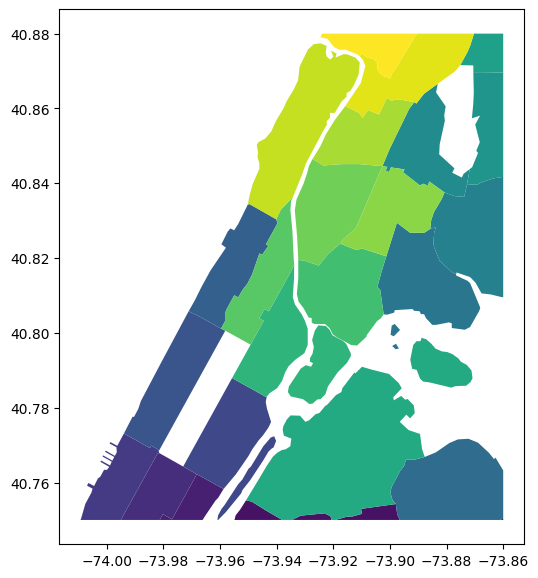

In [16]:
# Clip air quality data to New York City bounding box to reduce file size / memory usage
airquality = airquality.clip(NY_BBOX)
# Visualize the community districts with air quality data
airquality.plot(figsize=(6, 8), cmap="viridis");

In [17]:
# Save the clipped air quality data for later use in feature engineering
airquality.to_file("./DATA/processed/ny_airquality.geojson", driver="GeoJSON")

## Traffic Count
Another data source that has been used is traffic data. Busy intersections and roads that lead to congestion will likely cause a buildup of fumes and consequently UHIs. Therefore, allowing the model to see which parts of the city are often congested and see heavy traffic should result in better estimation of UHI values.

The New York State Department of Transportation provides a openly accessible "Traffic Data Viewer" that allows one to explore different traffic related statistics for the whole state. The underlying data can be downloaded at:

https://www.dot.ny.gov/tdv

by clicking on the file named "TDV GDB Shapefile Short Counts 2019.zip" or by directly requesting the following URL:

https://www.dot.ny.gov/divisions/engineering/applications/traffic-data-viewer/traffic-data-viewer-repository/NYSDOT_TDV_ShortCount_2019.gdb.zip

We proceed to load the traffic data (which comes in geo database format) using geopandas and filter to include only data after 2017. There is no risk of data leakage in this dataset since the most recent year we can access is 2020. Similar to air quality data, we include multiple time-steps of data to reduce the effects of outliers or seasonal effects. After that, we select the relevant columns, clip the data to the competition geo-space, plot the data, and save to disk.

In [18]:
traffic = gpd.read_file("./DATA/raw/NYSDOT_TDV_ShortCount_2019.gdb/")
traffic = traffic.loc[traffic["CountYear"] >= 2018]
traffic[["CountYear", "CountMonth"]].agg(["min", "max"]) # Sanity check to ensure no data leakage

,CountYear,CountMonth
min,2018.0,1.0
max,2020.0,12.0


In [19]:
traffic = traffic[
    [
        "AvgWeekdayInterval_1",
        "AvgWeekdayInterval_2",
        "AvgWeekdayInterval_3",
        "AvgWeekdayInterval_4",
        "AvgWeekdayInterval_5",
        "AvgWeekdayInterval_6",
        "AvgWeekdayInterval_7",
        "AvgWeekdayInterval_8",
        "AvgWeekdayInterval_9",
        "AvgWeekdayInterval_10",
        "AvgWeekdayInterval_11",
        "AvgWeekdayInterval_12",
        "AvgWeekdayInterval_13",
        "AvgWeekdayInterval_14",
        "AvgWeekdayInterval_15",
        "AvgWeekdayInterval_16",
        "AvgWeekdayInterval_17",
        "AvgWeekdayInterval_18",
        "AvgWeekdayInterval_19",
        "AvgWeekdayInterval_20",
        "AvgWeekdayInterval_21",
        "AvgWeekdayInterval_22",
        "AvgWeekdayInterval_23",
        "AvgWeekdayInterval_24",
        "AvgWkdyDailyTraffic",
        "AADT",
        "HighHourValue",
        "geometry",
    ]
]
traffic.head()

,AvgWeekdayInterval_1,AvgWeekdayInterval_2,AvgWeekdayInterval_3,AvgWeekdayInterval_4,AvgWeekdayInterval_5,AvgWeekdayInterval_6,AvgWeekdayInterval_7,AvgWeekdayInterval_8,AvgWeekdayInterval_9,AvgWeekdayInterval_10,...,AvgWeekdayInterval_19,AvgWeekdayInterval_20,AvgWeekdayInterval_21,AvgWeekdayInterval_22,AvgWeekdayInterval_23,AvgWeekdayInterval_24,AvgWkdyDailyTraffic,AADT,HighHourValue,geometry
0,144.0,78.0,48.0,37.0,52.0,76.0,160.0,210.0,266.0,280.0,...,340.0,308.0,300.0,262.0,222.0,197.0,5468.0,4971.0,348.0,POINT (587644.808 4497637.069)
1,114.0,56.0,56.0,34.0,54.0,110.0,219.0,272.0,314.0,316.0,...,311.0,305.0,282.0,252.0,241.0,166.0,5488.0,4989.0,348.0,POINT (587644.808 4497637.069)
2,258.0,134.0,104.0,71.0,106.0,186.0,379.0,482.0,580.0,596.0,...,651.0,613.0,582.0,514.0,463.0,363.0,10956.0,9960.0,677.0,POINT (587644.808 4497637.069)
3,50.0,28.0,21.0,16.0,28.0,48.0,106.0,150.0,206.0,218.0,...,217.0,170.0,149.0,118.0,99.0,67.0,3467.0,3152.0,234.0,POINT (587296.515 4494587.696)
4,57.0,36.0,21.0,21.0,30.0,30.0,74.0,129.0,208.0,236.0,...,234.0,208.0,164.0,145.0,114.0,82.0,3766.0,3424.0,266.0,POINT (587296.515 4494587.696)


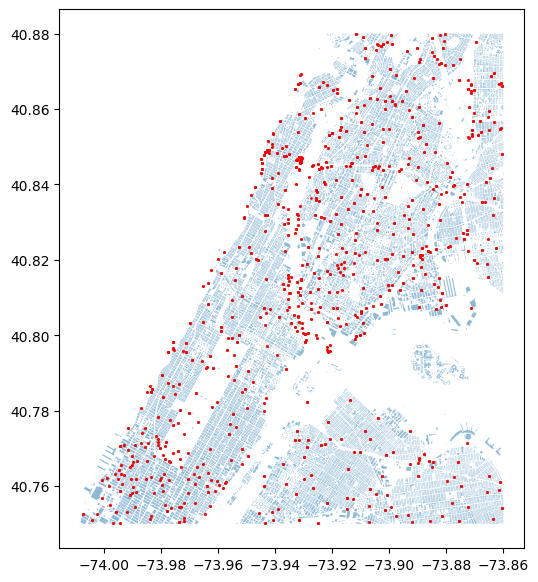

In [20]:
# Clip traffic data to New York City bounding box to reduce file size / memory usage
traffic = traffic.to_crs(epsg=4326) # Set to same CRS as other datasets
traffic = traffic.clip(NY_BBOX)
# Visualize the traffic count measurement locations on building footprints (they provide a nice pseudo-grid of the city)
fig, ax = plt.subplots(figsize=(6, 8))
buildings.plot(ax=ax, alpha=0.5)
traffic.plot(ax=ax, color="red", markersize=1)
plt.show()

In [21]:
# Save the clipped traffic data for later use in feature engineering
traffic.to_file("./DATA/processed/ny_traffic.geojson", driver="GeoJSON")

## Energy, Water, and GHG Emissions
Buildings themselves also affect the environment. Especially factors such as poor insulation, high energy usage, or excessive water usage contribute to heat buildup. Therefore, we also use building emissions data to create features. According to "the NYC Benchmarking Law, Local Law 84 of 2009 as amended, requires buildings to annually assess the efficiency of their building’s energy and water consumption. First enacted in 2009, this law has set the foundation for sustainable decision-making for NYC building owners" (https://www.nyc.gov/site/buildings/codes/ll84-benchmarking-law.page).

Data and metrics on water and energy consumption in privately owned buildings over 25,000 ft2 and in City-owned buildings over 10,000 ft2 has been downloaded from the official NewYorkCity data page in csv format using the "Export" button:

https://data.cityofnewyork.us/Environment/Energy-and-Water-Data-Disclosure-for-Local-Law-84-/usc3-8zwd/about_data

The provided dataset is released on a yearly basis. As such, to prevent data leakage, we use the dataset from 2020. After loading the dataset, we remove features that are not needed, clip the data to the competition geo-space, plot the data, and save to disk.

In [22]:
emissions= pd.read_csv("./DATA/raw/Energy_Water_2020.csv").astype({"Longitude": float, "Latitude": float})
emissions = gpd.GeoDataFrame(emissions, geometry=gpd.points_from_xy(emissions.Longitude, emissions.Latitude), crs=4326)
emissions.head()

,Property Id,Property Name,Parent Property Id,Parent Property Name,Year Ending,"NYC Borough, Block and Lot (BBL)",NYC Building Identification Number (BIN),Address 1,City,Postcode,...,Generation Date,Release Date,Borough,Community Board,Council District,Census Tract,NTA,Longitude,Latitude,geometry
0,7365,1155,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2020,1009970029,1022631,1155 Avenue of the Americas,Manhattan,10036,...,05/20/2021 02:43:12 PM,05/20/2021 02:44:16 PM,MANHATTAN,105.0,4.0,119.0,Midtown-Midtown South,-73.982826,40.756631,POINT (-73.98283 40.75663)
1,8139,200,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2020,1013150001,1037545,200 East 42nd St.,Manhattan,10017,...,05/20/2021 02:43:12 PM,05/20/2021 02:44:16 PM,MANHATTAN,106.0,4.0,88.0,Turtle Bay-East Midtown,-73.974306,40.750698,POINT (-73.97431 40.7507)
2,8604,114,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2020,1009990019,1022667,114 West 47th st,Manhattan,10036,...,05/21/2021 04:10:56 PM,05/21/2021 04:13:00 PM,MANHATTAN,105.0,4.0,125.0,Midtown-Midtown South,-73.982504,40.758310,POINT (-73.9825 40.75831)
3,8841,733,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2020,1013190047,1037596,733 Third Avenue,Manhattan,10017,...,05/20/2021 02:43:13 PM,05/20/2021 02:44:16 PM,MANHATTAN,106.0,4.0,90.0,Turtle Bay-East Midtown,-73.972753,40.753074,POINT (-73.97275 40.75307)
4,11809,Conde Nast Building,Not Applicable: Standalone Property,Not Applicable: Standalone Property,12/31/2020,1009950005,1085682,4 Times Square,Manhattan,10036,...,05/10/2021 06:30:37 PM,05/10/2021 06:34:54 PM,MANHATTAN,105.0,4.0,119.0,Midtown-Midtown South,-73.986244,40.756181,POINT (-73.98624 40.75618)


In [23]:
emissions = emissions[
    [
        "ENERGY STAR Score",
        "National Median ENERGY STAR Score",
        "Target ENERGY STAR Score",
        "ENERGY STAR Certification - Eligibility",
        "Site EUI (kBtu/ft²)",
        "Weather Normalized Site EUI (kBtu/ft²)",
        "National Median Site EUI (kBtu/ft²)",
        "Site Energy Use (kBtu)",
        "Weather Normalized Site Energy Use (kBtu)",
        "Weather Normalized Site Electricity Intensity (kWh/ft²)",
        "Weather Normalized Site Natural Gas Intensity (therms/ft²)",
        "Source EUI (kBtu/ft²)",
        "Weather Normalized Source EUI (kBtu/ft²)",
        "National Median Source EUI (kBtu/ft²)",
        "Source Energy Use (kBtu)",
        "Weather Normalized Source Energy Use (kBtu)",
        "Fuel Oil #1 Use (kBtu)",
        "Fuel Oil #2 Use (kBtu)",
        "Fuel Oil #4 Use (kBtu)",
        "Fuel Oil #5 & 6 Use (kBtu)",
        "Diesel #2 Use (kBtu)",
        "Propane Use (kBtu)",
        "District Steam Use (kBtu)",
        "District Hot Water Use (kBtu)",
        "District Chilled Water Use (kBtu)",
        "Natural Gas Use (kBtu)",
        "Natural Gas Use (therms)",
        "Weather Normalized Site Natural Gas Use (therms)",
        "Electricity Use - Grid Purchase (kBtu)",
        "Electricity Use - Grid Purchase (kWh)",
        "Weather Normalized Site Electricity (kWh)",
        "Electricity Use - Grid Purchase and Generated from Onsite Renewable Systems (kWh)",
        "Electricity Use - Grid Purchase and Generated from Onsite Renewable Systems (kBtu)",
        "Electricity Use – Generated from Onsite Renewable Systems and Used Onsite (kWh)",
        "Electricity Use – Generated from Onsite Renewable Systems and Used Onsite (kBtu)",
        "Electricity Use – Generated from Onsite Renewable Systems (kWh)",
        "Electricity Use – Generated from Onsite Renewable Systems and Exported (kWh)",
        "Annual Maximum Demand (kW)",
        "Green Power - Onsite (kWh)",
        "Green Power - Offsite (kWh)",
        "Green Power - Onsite and Offsite (kWh)",
        "Total GHG Emissions (Metric Tons CO2e)",
        "Direct GHG Emissions (Metric Tons CO2e)",
        "Total GHG Emissions Intensity (kgCO2e/ft²)",
        "Direct GHG Emissions Intensity (kgCO2e/ft²)",
        "Indirect GHG Emissions (Metric Tons CO2e)",
        "Net Emissions (Metric Tons CO2e)",
        "Indirect GHG Emissions Intensity (kgCO2e/ft²)",
        "National Median Total GHG Emissions (Metric Tons CO2e)",
        "eGRID Output Emissions Rate (kgCO2e/MBtu)",
        "Avoided Emissions - Onsite Green Power (Metric Tons CO2e)",
        "Avoided Emissions - Offsite Green Power (Metric Tons CO2e)",
        "Avoided Emissions - Onsite and Offsite Green Power (Metric Tons CO2e)",
        "Percent of Electricity that is Green Power",
        "Percent of RECs Retained",
        "Percent of Total Electricity Generated from Onsite Renewable Systems",
        "Water Use (All Water Sources) (kgal)",
        "Indoor Water Use (All Water Sources) (kgal)",
        "Outdoor Water Use (All Water Sources) (kgal)",
        "Municipally Supplied Potable Water - Mixed Indoor/Outdoor Use (kgal)",
        "Municipally Supplied Potable Water - Total Use (All Meter Types) (kgal)",
        "Municipally Supplied Potable Water - Indoor Use (kgal)",
        "Municipally Supplied Potable Water - Outdoor Use (kgal)",
        "geometry",
    ]
]
# Fill all occurances of "Not Available" with NaN
emissions = emissions.replace(["Not Available", "Insufficient access"], np.nan)

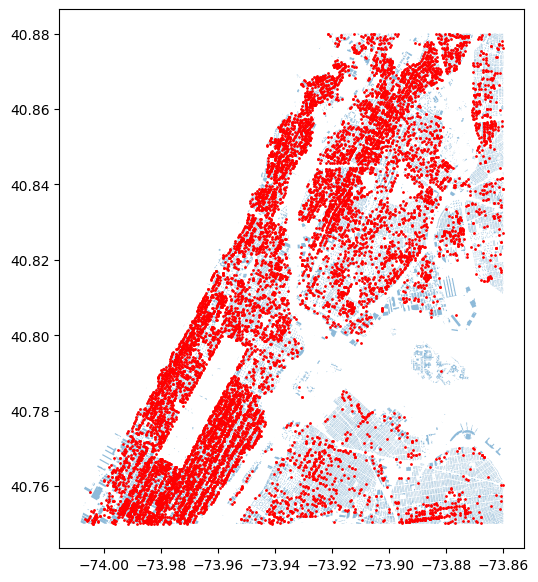

In [24]:
# Clip emissions data to New York City bounding box to reduce file size / memory usage
emissions = emissions.clip(NY_BBOX)
# Visualize the emissions locations on building footprints (they provide a nice pseudo-grid of the city and emissions are actually building specific)
fig, ax = plt.subplots(figsize=(6, 8))
buildings.plot(ax=ax, alpha=0.5)
emissions.plot(ax=ax, color="red", markersize=1)
plt.show()

In [25]:
emissions.to_file("./DATA/processed/ny_emissions.geojson", driver="GeoJSON")

## Satellite Imagery
To obtain satellite imagery, we mostly follow the starter notebook(s) provided by the competition. However, images are sampled with less cloud cover and use the median composite to reduce the effect of visual artefacts and clouds. At the time of writing, we realize that the official starter notebook for Satellite imagery actually introduces data leakage, since the time-frame chosen extends until the 01-09-2021. While the effects are very minor at best in the image data (especially since the median composite is used), this is something that should be adressed if any submitted solution is to be scaled properly.

### Sentinel2 Satellite

In [26]:
sentinel_catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

sentinel_search = sentinel_catalog.search(
    bbox=NY_BBOX, 
    datetime="2021-06-01/2021-09-01",
    collections=["sentinel-2-l2a"],
    query={"eo:cloud_cover": {"lt": 25}},
)

In [27]:
sentinel_items = list(sentinel_search.get_items())
print(f"Found {len(sentinel_items)} satellite images in the search area and time range")

Found 9 satellite images in the search area and time range


In [28]:
sentinel_resolution = 10  # meters per pixel 
sentinel_scale = sentinel_resolution / 111320.0 # degrees per pixel for crs=4326 

In [29]:
sentinel_data = stac_load(
    sentinel_items,
    bands=["B01", "B02", "B03", "B04", "B05", "B06", "B07", "B08", "B8A", "B11", "B12"],
    crs="EPSG:4326", # Latitude-Longitude
    resolution=sentinel_scale, # Degrees
    chunks={"x": 2048, "y": 2048},
    dtype="uint16",
    patch_url=planetary_computer.sign,
    bbox=NY_BBOX
)

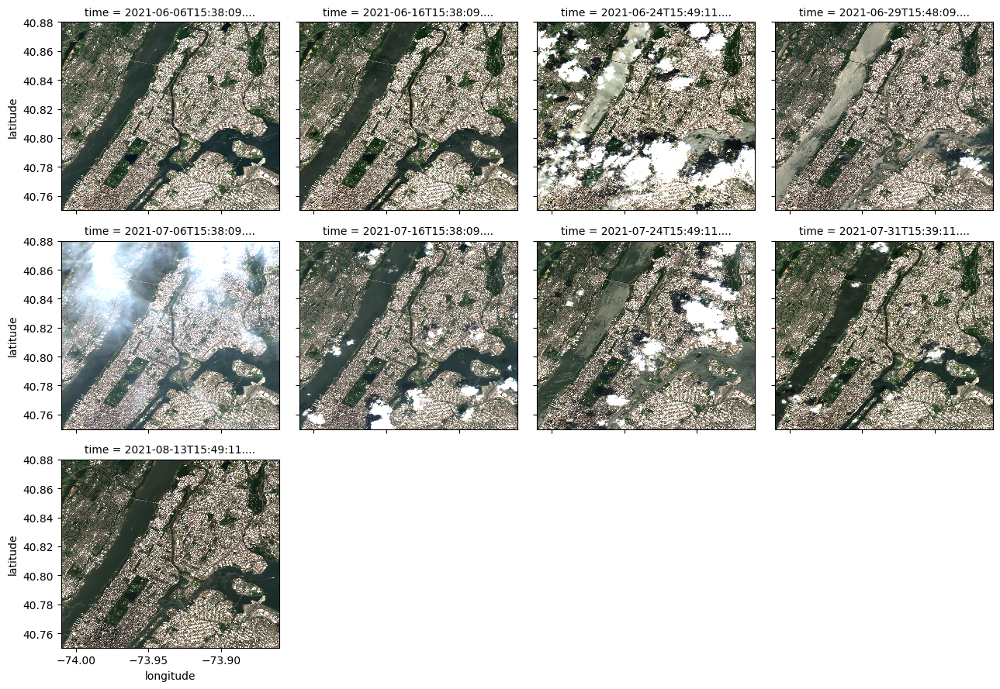

In [30]:
# Plot an RGB image for a single date
sentinel_data[["B04","B03","B02"]].to_array().plot.imshow(col='time', col_wrap=4, robust=True, vmin=0, vmax=2500)
plt.show()

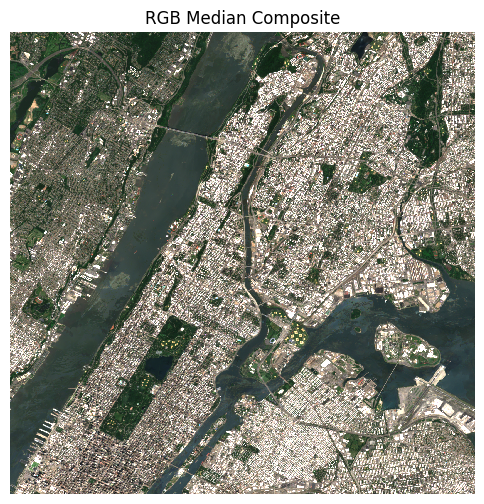

In [31]:
# Median Composite
sentinel_median = sentinel_data.median(dim="time").compute()

# Plot the median composite
fig, ax = plt.subplots(figsize=(6,6))
sentinel_median[["B04", "B03", "B02"]].to_array().plot.imshow(robust=True, ax=ax, vmin=0, vmax=2500)
ax.set_title("RGB Median Composite")
ax.axis('off')
plt.show()

In [32]:
# Save median composite to GeoTIFF

sentinel_height = sentinel_median.dims["latitude"]
sentinel_width = sentinel_median.dims["longitude"]

sentinel_gt = rasterio.transform.from_bounds(NY_LOW_LEFT[1],NY_LOW_LEFT[0],NY_UP_RIGHT[1],NY_UP_RIGHT[0], sentinel_width, sentinel_height)
sentinel_median.rio.write_crs("epsg:4326", inplace=True)
sentinel_median.rio.write_transform(transform=sentinel_gt, inplace=True)


# ["B01", "B02", "B03", "B04", "B05", "B06", "B07", "B08", "B8A", "B11", "B12"]
with rasterio.open("./DATA/processed/Sentinel2_Median.tiff",'w', driver='GTiff', width=sentinel_width, height=sentinel_height,
                   crs='epsg:4326',transform=sentinel_gt,count=11,compress='lzw',dtype='float64') as dst:
    dst.write(sentinel_median.B01, 1)
    dst.write(sentinel_median.B02, 2)
    dst.write(sentinel_median.B03, 3)
    dst.write(sentinel_median.B04, 4)
    dst.write(sentinel_median.B05, 5)
    dst.write(sentinel_median.B06, 6)
    dst.write(sentinel_median.B07, 7)
    dst.write(sentinel_median.B08, 8)
    dst.write(sentinel_median.B8A, 9)
    dst.write(sentinel_median.B11, 10)
    dst.write(sentinel_median.B12, 11)

    dst.close()

### Landsat8 Satellite

In [33]:
landsat_catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

landsat_search = landsat_catalog.search(
    bbox=NY_BBOX, 
    datetime="2021-06-01/2021-09-01",
    collections=["landsat-c2-l2"],
    query={"eo:cloud_cover": {"lt": 25},"platform": {"in": ["landsat-8"]}},
)

In [34]:
landsat_items = list(landsat_search.get_items())
print(f"Found {len(landsat_items)} satellite images in the search area and time range")

Found 7 satellite images in the search area and time range


In [35]:
landsat_resolution = 30  # meters per pixel 
landsat_scale = landsat_resolution / 111320.0 # degrees per pixel for crs=4326

In [36]:
landsat_data = stac_load(
    landsat_items,
    bands = ["coastal", "blue", "green", "red", "nir08", "swir16", "swir22", "lwir11"],
    crs="EPSG:4326", # Latitude-Longitude
    resolution=landsat_scale, # Degrees
    chunks={"x": 2048, "y": 2048},
    dtype="uint16",
    patch_url=planetary_computer.sign,
    bbox=NY_BBOX
)

In [37]:
# Scaling of Landsat 8 data
# Surface reflectance bands (band * factor + offset)
landsat_data[["coastal", "blue", "green", "red", "nir08", "swir16", "swir22"]] = (landsat_data[["coastal", "blue", "green", "red", "nir08", "swir16", "swir22"]] * 0.0000275) - 0.2
# Surface temperature band (band * factor + offset - kelvin to celsius)
landsat_data["lwir11"] = (landsat_data["lwir11"] * 0.00341802) + 149.0 - 273.15

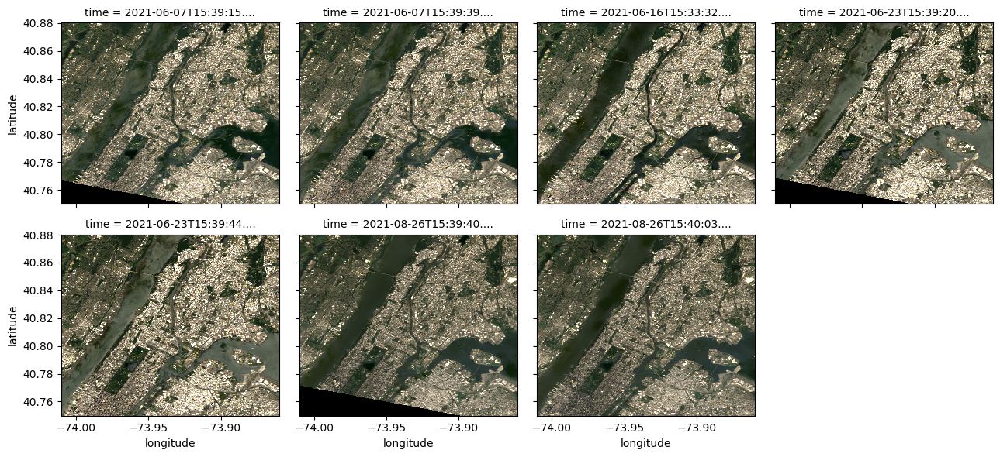

In [38]:
landsat_data[["red","green","blue"]].to_array().plot.imshow(col='time', col_wrap=4, robust=True, vmin=0, vmax=0.25)
plt.show()

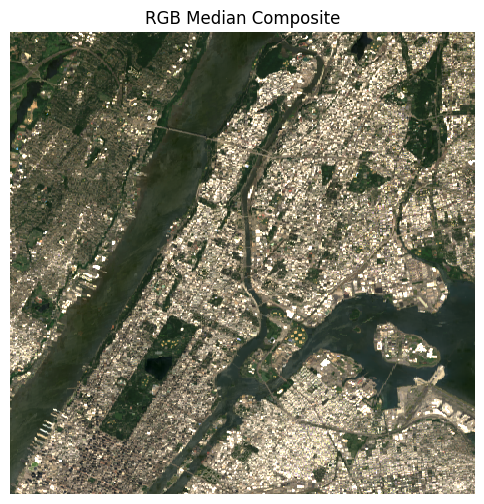

In [39]:
# Median Composite (only using index 1, 2, 4, 6 since black bars introduce heavy noise)
landsat_median = landsat_data.isel(time=[1, 2, 4, 6]).median(dim="time").compute()

# Plot the median composite
fig, ax = plt.subplots(figsize=(6,6))
landsat_median[["red", "green", "blue"]].to_array().plot.imshow(robust=True, ax=ax, vmin=0, vmax=0.25)
ax.set_title("RGB Median Composite")
ax.axis('off')
plt.show()

In [40]:
landsat_height = landsat_median.dims["latitude"]
landsat_width = landsat_median.dims["longitude"]

landsat_gt = rasterio.transform.from_bounds(NY_LOW_LEFT[1],NY_LOW_LEFT[0],NY_UP_RIGHT[1],NY_UP_RIGHT[0], landsat_width, landsat_height)
landsat_median.rio.write_crs("epsg:4326", inplace=True)
landsat_median.rio.write_transform(transform=landsat_gt, inplace=True)


# ["coastal", "blue", "green", "red", "nir08", "swir16", "swir22", "lwir11"]
with rasterio.open("./DATA/processed/Landsat8_Median.tiff",'w', driver='GTiff', width=landsat_width, height=landsat_height,
                   crs='epsg:4326',transform=landsat_gt,count=8,compress='lzw',dtype='float64') as dst:
    dst.write(landsat_median.coastal, 1)
    dst.write(landsat_median.blue, 2)
    dst.write(landsat_median.green, 3)
    dst.write(landsat_median.red, 4)
    dst.write(landsat_median.nir08, 5)
    dst.write(landsat_median.swir16, 6)
    dst.write(landsat_median.swir22, 7)
    dst.write(landsat_median.lwir11, 8)
    
    dst.close()

## A note on weather data
Since weather data was already provided in a preprocessed format, no additional data preprocessing was required. We were able to directly use the provided .xlsx file for feature engineering.

# 2) Feature Engineering

For each major data source, a feature engineering function has been defined. This reduces code repetition and reduces memory usage when reading multiple files - this is especially relevant for building footprint and satellite data. In general, the feature engineering process can be described as follows:

- Read preprocessed data and reproject data to the Universal Transverse Mercador (UTM) coordinate system. This allows us to display buffer zones in meters, which allows one visually understand and interpret these features.
- We create a buffer around a training sample (10 meters, 20 meters etc.) and then create aggregated features for said buffer region (mean, min, max etc.). This not only acts as regularization but also allows for more interpretable features. Intuitively, it is unlikely that a feature on the exact point were a person is standing contributes to UHI. Instead, one would look at the sourrounding environment. This methodology has been deeply integrated in our feature engineering pipeline.
- The aggregated features are then merged to the respective training point that the buffer zone was created around and the updated dataset is returned.

For more efficiency, the use of spatial joins is preferred over iterating the training samples one by one, greatly speeding up the data preprocessing. In general, the maximum buffer distance for satellite data has been chosen at 300 meters while for other features (most of which are building or district-related), the maximum buffer distance has been chosen at 1000 meters. The reason is that satellite data has more datapoints (since its pixels essentially) which make the computations more time and resource intensive.

> Note: If you run into memory issues when generating features, it may be advisable to restart the jupyter kernel and start here directly instead of regenerating the datasets. that way, the prior datasets are not in memory anymore, but read from disk instead (on my machine with 32GB I faced no issues, but memory usage did reach >20GB when calculating Sentinel2 features - all other functions are not so memory intensive)

In [41]:
# Utility functions for feature engineering

# Clean column names
def clean_col_names(dataframe):
    df = dataframe.copy()
    df.columns = [col.replace("[", " ") for col in df.columns]
    df.columns = [col.replace("]", " ") for col in df.columns]
    df.columns = [col.replace(",", " ") for col in df.columns]
    df.columns = [col.replace(" ", "_") for col in df.columns]
    return df

# Drop any columns with more than a certain threshold of NaN values
def drop_nan_over(dataframe, threshold):
    df = dataframe.copy()
    drop_cols = df.columns[(df.isna().sum() / len(df) > threshold)]
    df = df.drop(columns=drop_cols)
    return df

Here we initialize two lists for the feature engineeering data to be stored. These will be a list of dataframes that can easily be concatenated before training.

In [42]:
train_dfs = []
test_dfs = []

## Building Footprints
Building footprint features are calculated using the rooftop height, construction year, ground elevation, and feature code. The feature code refers to the type of building, such as parking lots, garages, normal buildings etc. A detailed description of the feature codes can be found here:

https://github.com/CityOfNewYork/nyc-geo-metadata/blob/main/Metadata/Metadata_BuildingFootprints.md

As initially described, we load the data, create buffer zones, and create aggregated features. The function takes as input the following:
- data_df: The raw training data
- geojson_path: The path to the preprocessed data in geojson file format
- buffer_distances: A list of integers describing how many meters the buffers should be
- agg_levels: A list of Pandas compatible string representation of aggregation functions

In [43]:
def calculate_building_features(data_df, geojson_path, buffer_distances, agg_levels):
    data = data_df.copy()

    # Progress bar
    progbar = tqdm(total=len(buffer_distances), desc="Reading Building Footprint data")

    # Read building footprints
    buildings = gpd.read_file(geojson_path, crs=4326)
    buildings = buildings.astype(
        {
            "heightroof": float,
            "cnstrct_yr": float,
            "groundelev": float,
            "feat_code": float,
        }
    )

    # Prepare train data as GeoDataFrame
    data_geometry = gpd.GeoDataFrame(
        data[["Longitude", "Latitude"]], geometry=gpd.points_from_xy(data["Longitude"], data["Latitude"]), crs=4326
    )

    # Estimate UTM CRS from data points and reproject both GeoDataFrames to this CRS
    utm_crs = data_geometry.estimate_utm_crs()
    data_geometry = data_geometry.to_crs(utm_crs)
    buildings = buildings.to_crs(utm_crs)

    # Aggregation functions
    agg_funcs = {
        "heightroof": agg_levels,
        "cnstrct_yr": agg_levels,
        "groundelev": agg_levels,
    }

    # Iterate through buffer distances
    aggregations = []
    for distance in buffer_distances:
        # Create buffers for all points
        progbar.set_description(f"Calculating Building Features for buffer {distance}m")
        data_geometry["buffer"] = data_geometry.geometry.buffer(distance)

        # Perform spatial join: buildings within buffers
        buffer_gdf = data_geometry.set_geometry("buffer")
        joined = gpd.sjoin(buildings, buffer_gdf, how="left", predicate="intersects")

        # Aggregate statistics for all features
        grouped = joined.groupby("index_right", dropna=False)
        for feature, funcs in agg_funcs.items():
            agg = grouped[feature].agg(funcs)
            agg.columns = [f"{func}_{feature}_{distance}m" for func in funcs]
            aggregations.append(agg)

        # Count number of buildings by type
        counts = (
            grouped["feat_code"]
            .value_counts()
            .unstack(fill_value=0)
            .rename(
                columns={
                    1000: f"num_parking_{distance}m",
                    1001: f"num_gas_station_{distance}m",
                    1002: f"num_storage_tank_{distance}m",
                    1003: f"num_placeholder_{distance}m",
                    1004: f"num_auxiliary_{distance}m",
                    1005: f"num_temporary_{distance}m",
                    1006: f"num_cantilevered_{distance}m",
                    2100: f"num_building_{distance}m",
                    2110: f"num_skybridge_{distance}m",
                    5100: f"num_building_under_construction_{distance}m",
                    5110: f"num_garage_{distance}m",
                }
            )
        )
        counts[f"num_total_structures_{distance}m"] = counts.sum(axis=1)
        aggregations.append(counts)

        # Update progress bar
        progbar.update(1)

    # Merge all aggregations to the original data
    for agg in aggregations:
        data = data.merge(agg, left_index=True, right_index=True, how="left")

    progbar.close()

    return data

In [44]:
# Create building footprint features
building_features = calculate_building_features(train, "./DATA/processed/ny_buildings.geojson", [75, 100, 250, 500, 750, 1_000], ["min", "max", "mean", "std", "skew", "sum", "median"])
# Drop duplicate columns that are created in the process and append to train_dfs (the target UHI Index is kept for this first iteration since it is otherwise lost completely)
train_dfs.append(building_features.drop(columns=["Latitude", "Longitude", "datetime"]))

Reading Building Footprint data:   0%|          | 0/6 [00:00<?, ?it/s]

In [45]:
building_features.head()

,Longitude,Latitude,datetime,UHI Index,min_heightroof_75m,max_heightroof_75m,mean_heightroof_75m,std_heightroof_75m,skew_heightroof_75m,sum_heightroof_75m,...,num_parking_1000m,num_gas_station_1000m,num_auxiliary_1000m,num_temporary_1000m,num_cantilevered_1000m,num_building_1000m,num_skybridge_1000m,num_building_under_construction_1000m,num_garage_1000m,num_total_structures_1000m
0.0,-73.909167,40.813107,2021-07-24 15:53:00,1.030289,11.2,189.393844,55.472286,58.986985,1.906733,776.612011,...,0,1,0,0,0,2942,0,0,102,3045
1.0,-73.909187,40.813045,2021-07-24 15:53:00,1.030289,11.2,189.393844,55.078801,56.861707,1.978720,826.182011,...,0,1,0,0,0,2937,0,0,102,3040
2.0,-73.909215,40.812978,2021-07-24 15:53:00,1.023798,11.2,189.393844,54.652001,54.960149,2.052208,874.432011,...,0,1,0,0,0,2930,0,0,101,3032
3.0,-73.909242,40.812908,2021-07-24 15:53:00,1.023798,11.2,189.393844,53.555112,51.742965,2.206246,963.992011,...,0,1,0,0,0,2918,0,0,100,3019
4.0,-73.909257,40.812845,2021-07-24 15:53:00,1.021634,11.2,189.393844,52.797101,49.028058,2.342294,1055.942011,...,0,1,0,0,0,2907,0,0,97,3005


## Cooling Tower Registrations
From the cooling tower registrations dataset, the only feature used is the "Active_Equip" variable, which points to how many cooling towers are installed on a specific building.

As initially described, we load the data, create buffer zones, and create aggregated features. The function takes as input the following:
- data_df: The raw training data
- geojson_path: The path to the preprocessed data in geojson file format
- buffer_distances: A list of integers describing how many meters the buffers should be
- agg_levels: A list of Pandas compatible string representation of aggregation functions

In [46]:
def calculate_cooltower_features(data_df, geojson_path, buffer_distances, agg_levels):
    data = data_df.copy()

    # Progress bar
    progbar = tqdm(total=len(buffer_distances), desc="Reading Cooling Tower data")

    # Read cooling tower data
    cooling_towers = gpd.read_file(geojson_path, crs=4326)
    cooling_towers = cooling_towers[["geometry", "Active_Equip"]]

    # Prepare train data as GeoDataFrame
    data_geometry = gpd.GeoDataFrame(
        data[["Longitude", "Latitude"]], geometry=gpd.points_from_xy(data["Longitude"], data["Latitude"]), crs=4326
    )

    # Estimate UTM CRS from data points and reproject both GeoDataFrames to this CRS
    utm_crs = data_geometry.estimate_utm_crs()
    data_geometry = data_geometry.to_crs(utm_crs)
    cooling_towers = cooling_towers.to_crs(utm_crs)

    # Aggregation functions
    agg_funcs = {
        "Active_Equip": agg_levels,
    }

    # Iterate through buffer distances
    aggregations = []
    for distance in buffer_distances:
        # Create buffers for all points
        progbar.set_description(f"Calculating Cooling Tower Features for buffer {distance}m")
        data_geometry["buffer"] = data_geometry.geometry.buffer(distance)

        # Perform spatial join: cooling_towers within buffers
        buffer_gdf = data_geometry.set_geometry("buffer")
        joined = gpd.sjoin(cooling_towers, buffer_gdf, how="left", predicate="intersects")
        # Aggregate statistics for all features
        grouped = joined.groupby("index_right", dropna=False)
        for feature, funcs in agg_funcs.items():
            agg = grouped[feature].agg(funcs)
            agg.columns = [f"{func}_{feature}_{distance}m" for func in funcs]
            agg[f"num_cooltowers_{distance}m"] = grouped["index_right"].value_counts()
            aggregations.append(agg)

        # Update progress bar
        progbar.update(1)

    for agg in aggregations:
        data = data.merge(agg, left_index=True, right_index=True, how="left")

    progbar.close()

    return data

In [47]:
# Create cooling tower features
cooltower_features = calculate_cooltower_features(train, "./DATA/processed/ny_cooltowers.geojson", [500], ["max"])
# Drop duplicate columns that are created in the process and append to train_dfs
train_dfs.append(cooltower_features.drop(columns=["Latitude", "Longitude", "datetime", "UHI Index"]))

Reading Cooling Tower data:   0%|          | 0/1 [00:00<?, ?it/s]

In [48]:
cooltower_features.head()

,Longitude,Latitude,datetime,UHI Index,max_Active_Equip_500m,num_cooltowers_500m
0.0,-73.909167,40.813107,2021-07-24 15:53:00,1.030289,3.0,1.0
1.0,-73.909187,40.813045,2021-07-24 15:53:00,1.030289,3.0,1.0
2.0,-73.909215,40.812978,2021-07-24 15:53:00,1.023798,3.0,1.0
3.0,-73.909242,40.812908,2021-07-24 15:53:00,1.023798,3.0,1.0
4.0,-73.909257,40.812845,2021-07-24 15:53:00,1.021634,3.0,1.0


## Air Quality
The air quality dataset we processed in step 1 already contains aggregated features on CD-level and is processed without buffer zones. More specifically, a simple spatial join is used to decide in which CD a training point lies. The already aggregated air quality measurements for that CD are then mapped to the respective training sample.

The features in this dataset correspond to "Indicator IDs", which can be translated to the following:
- Indicator ID: 375 - Nitrogen dioxide (NO2)_Mean_ppb -> average concentration of nitrogen dioxide (NO₂) in parts per billion (ppb) 
- Indicator ID: 365 - Fine particles (PM 2.5)_Mean_mcg/m3 -> average concentration of fine particulate matter (PM₂.₅) in micrograms per cubic meter (µg/m³) 
- Indicator ID: 386 - Ozone (O3)_Mean_ppb -> average concentration of ozone (O₃) in parts per billion (ppb)

The function takes as input the following:
- data_df: The raw training data
- geojson_path: The path to the preprocessed data in geojson file format

In [49]:
def calculate_airquality_features(data_df, geojson_path):
    data = data_df.copy()

    # Read airquality data
    air_quality = gpd.read_file(geojson_path, crs=4326)

    # Prepare train data as GeoDataFrame
    data_geometry = gpd.GeoDataFrame(
        data, geometry=gpd.points_from_xy(data["Longitude"], data["Latitude"]), crs=4326
    )

    # Spacial join
    data = gpd.sjoin(data_geometry, air_quality, how="left", predicate="intersects")

    return data.drop(columns=["index_right", "geometry"])

In [50]:
# Create air quality features
airquality_features = calculate_airquality_features(train, "./DATA/processed/ny_airquality.geojson")
# Drop duplicate columns that are created in the process and append to train_dfs
train_dfs.append(airquality_features.drop(columns=["Latitude", "Longitude", "datetime", "UHI Index"]))

In [51]:
airquality_features.head()

,Longitude,Latitude,datetime,UHI Index,AQ_Indicator_365_max,AQ_Indicator_375_max,AQ_Indicator_386_max,AQ_Indicator_365_mean,AQ_Indicator_375_mean,AQ_Indicator_386_mean,AQ_Indicator_365_min,AQ_Indicator_375_min,AQ_Indicator_386_min,AQ_Indicator_365_std,AQ_Indicator_375_std
0,-73.909167,40.813107,2021-07-24 15:53:00,1.030289,7.5,26.2,30.6,7.033333,20.1,30.6,6.3,15.0,30.6,0.64291,5.666569
1,-73.909187,40.813045,2021-07-24 15:53:00,1.030289,7.5,26.2,30.6,7.033333,20.1,30.6,6.3,15.0,30.6,0.64291,5.666569
2,-73.909215,40.812978,2021-07-24 15:53:00,1.023798,7.5,26.2,30.6,7.033333,20.1,30.6,6.3,15.0,30.6,0.64291,5.666569
3,-73.909242,40.812908,2021-07-24 15:53:00,1.023798,7.5,26.2,30.6,7.033333,20.1,30.6,6.3,15.0,30.6,0.64291,5.666569
4,-73.909257,40.812845,2021-07-24 15:53:00,1.021634,7.5,26.2,30.6,7.033333,20.1,30.6,6.3,15.0,30.6,0.64291,5.666569


## Traffic Count
The traffic count dataset contains the following features we utilize in our pipeline:

- "AvgWeekdayInterval_h" were h is the hour of the day, thus describing the average traffic count at that location during hour h at any weekday.
- "AADT" describes the Annual Average Daily Traffic at the specified location.
- "HighHourValue" describes the highest traffic count among the "AvgWeekdayInterval_h" columns.

As initially described, we load the data, create buffer zones, and create aggregated features. The function takes as input the following:
- data_df: The raw training data
- geojson_path: The path to the preprocessed data in geojson file format
- buffer_distances: A list of integers describing how many meters the buffers should be
- agg_levels: A list of Pandas compatible string representation of aggregation functions

In [52]:
def calculate_traffic_features(data_df, geojson_path, buffer_distances, agg_levels):
    data = data_df.copy()

    # Progress bar
    progbar = tqdm(total=len(buffer_distances), desc="Reading Traffic data")

    # Read building footprints
    traffic = gpd.read_file(geojson_path, crs=4326)

    # Prepare train data as GeoDataFrame
    data_geometry = gpd.GeoDataFrame(
        data[["Longitude", "Latitude"]], geometry=gpd.points_from_xy(data["Longitude"], data["Latitude"]), crs=4326
    )

    # Estimate UTM CRS from data points and reproject both GeoDataFrames to this CRS
    utm_crs = data_geometry.estimate_utm_crs()
    data_geometry = data_geometry.to_crs(utm_crs)
    traffic = traffic.to_crs(utm_crs)

    # Aggregation functions
    agg_cols = traffic.columns.drop(["geometry"]).to_list()
    agg_funcs = {col: agg_levels for col in agg_cols}

    # Iterate through buffer distances
    aggregations = []
    for distance in buffer_distances:
        # Create buffers for all points
        progbar.set_description(f"Calculating Traffic Features for buffer {distance}m")
        data_geometry["buffer"] = data_geometry.geometry.buffer(distance)

        # Perform spatial join: traffic within buffers
        buffer_gdf = data_geometry.set_geometry("buffer")
        joined = gpd.sjoin(traffic, buffer_gdf, how="left", predicate="intersects")

        # Aggregate statistics for all features
        grouped = joined.groupby("index_right", dropna=False)
        for feature, funcs in agg_funcs.items():
            agg = grouped[feature].agg(funcs)
            agg.columns = [f"{func}_{feature}_{distance}m" for func in funcs]
            aggregations.append(agg)

        # Update progress bar
        progbar.update(1)

    for agg in aggregations:
        data = data.merge(agg, left_index=True, right_index=True, how="left")

    progbar.close()

    return data

In [53]:
# Create traffic count features
traffic_features = calculate_traffic_features(train, "./DATA/processed/ny_traffic.geojson", [500], ["max"])
# Drop duplicate columns that are created in the process and append to train_dfs
train_dfs.append(traffic_features.drop(columns=["Latitude", "Longitude", "datetime", "UHI Index"]))

Reading Traffic data:   0%|          | 0/1 [00:00<?, ?it/s]

In [54]:
traffic_features.head()

,Longitude,Latitude,datetime,UHI Index,max_AvgWeekdayInterval_1_500m,max_AvgWeekdayInterval_2_500m,max_AvgWeekdayInterval_3_500m,max_AvgWeekdayInterval_4_500m,max_AvgWeekdayInterval_5_500m,max_AvgWeekdayInterval_6_500m,...,max_AvgWeekdayInterval_18_500m,max_AvgWeekdayInterval_19_500m,max_AvgWeekdayInterval_20_500m,max_AvgWeekdayInterval_21_500m,max_AvgWeekdayInterval_22_500m,max_AvgWeekdayInterval_23_500m,max_AvgWeekdayInterval_24_500m,max_AvgWkdyDailyTraffic_500m,max_AADT_500m,max_HighHourValue_500m
0.0,-73.909167,40.813107,2021-07-24 15:53:00,1.030289,242.0,172.0,126.0,96.0,97.0,174.0,...,661.0,602.0,510.0,387.0,349.0,308.0,301.0,10121.0,9260.0,670.0
1.0,-73.909187,40.813045,2021-07-24 15:53:00,1.030289,242.0,172.0,126.0,96.0,97.0,174.0,...,661.0,602.0,510.0,387.0,349.0,308.0,301.0,10121.0,9260.0,670.0
2.0,-73.909215,40.812978,2021-07-24 15:53:00,1.023798,242.0,172.0,126.0,96.0,97.0,174.0,...,661.0,602.0,510.0,387.0,349.0,308.0,301.0,10121.0,9260.0,670.0
3.0,-73.909242,40.812908,2021-07-24 15:53:00,1.023798,242.0,172.0,126.0,96.0,97.0,174.0,...,661.0,602.0,510.0,387.0,349.0,308.0,301.0,10121.0,9260.0,670.0
4.0,-73.909257,40.812845,2021-07-24 15:53:00,1.021634,242.0,172.0,126.0,96.0,97.0,174.0,...,661.0,602.0,510.0,387.0,349.0,308.0,301.0,10121.0,9260.0,670.0


## Energy, Water, and GHG Emissions
The emissions dataset contains multiple features, too many to list individually here. However, all of them can be attributed to one of the following areas of interest:
- Electricity Usage
- Water Usage
- Greenhouse Gas Emissions
- Energy Star Rating

As initially described, we load the data, create buffer zones, and create aggregated features. The function takes as input the following:
- data_df: The raw training data
- geojson_path: The path to the preprocessed data in geojson file format
- buffer_distances: A list of integers describing how many meters the buffers should be
- agg_levels: A list of Pandas compatible string representation of aggregation functions

In [55]:
def calculate_emissions_features(data_df, geojson_path, buffer_distances, agg_levels):
    data = data_df.copy()

    # Progress bar
    progbar = tqdm(total=len(buffer_distances), desc="Reading Emissions data")

    # Read building footprints
    emissions = gpd.read_file(geojson_path, crs=4326)
    emissions["ENERGY STAR Certification - Eligibility"] = emissions["ENERGY STAR Certification - Eligibility"].map({"Yes": 1, "No": 0}).astype(int)

    # Prepare train data as GeoDataFrame
    data_geometry = gpd.GeoDataFrame(
        data[["Longitude", "Latitude"]], geometry=gpd.points_from_xy(data["Longitude"], data["Latitude"]), crs=4326
    )

    # Estimate UTM CRS from data points and reproject both GeoDataFrames to this CRS
    utm_crs = data_geometry.estimate_utm_crs()
    data_geometry = data_geometry.to_crs(utm_crs)
    emissions = emissions.to_crs(utm_crs)

    # Aggregation functions
    agg_cols = emissions.columns.drop(["geometry", "ENERGY STAR Certification - Eligibility"]).to_list()
    agg_funcs = {col: agg_levels for col in agg_cols}
    agg_funcs.update({
        "ENERGY STAR Certification - Eligibility": ["sum"],
    })
    emissions[agg_cols] = emissions[agg_cols].astype(float)

    # Iterate through buffer distances
    aggregations = []
    for distance in buffer_distances:
        # Create buffers for all points
        progbar.set_description(f"Calculating Emission Features for buffer {distance}m")
        data_geometry["buffer"] = data_geometry.geometry.buffer(distance)

        # Perform spatial join: emissions within buffers
        buffer_gdf = data_geometry.set_geometry("buffer")
        joined = gpd.sjoin(emissions, buffer_gdf, how="left", predicate="intersects")

        # Aggregate statistics for all features
        grouped = joined.groupby("index_right", dropna=False)
        for feature, funcs in agg_funcs.items():
            agg = grouped[feature].agg(funcs)
            agg.columns = [f"{func}_{feature}_{distance}m" for func in funcs]
            aggregations.append(agg)

        # Update progress bar
        progbar.update(1)

    for agg in aggregations:
        data = data.merge(agg, left_index=True, right_index=True, how="left")

    progbar.close()

    return data

In [56]:
# Create emission features
emission_features = calculate_emissions_features(train, "./DATA/processed/ny_emissions.geojson", [50, 75, 100, 250, 500, 750, 1_000], ["min", "max", "mean", "std", "skew", "sum"])
# Drop duplicate columns that are created in the process and append to train_dfs
train_dfs.append(emission_features.drop(columns=["Latitude", "Longitude", "datetime", "UHI Index"]))

Reading Emissions data:   0%|          | 0/7 [00:00<?, ?it/s]

In [57]:
emission_features.head()

,Longitude,Latitude,datetime,UHI Index,min_ENERGY STAR Score_50m,max_ENERGY STAR Score_50m,mean_ENERGY STAR Score_50m,std_ENERGY STAR Score_50m,skew_ENERGY STAR Score_50m,sum_ENERGY STAR Score_50m,...,std_Municipally Supplied Potable Water - Indoor Use (kgal)_1000m,skew_Municipally Supplied Potable Water - Indoor Use (kgal)_1000m,sum_Municipally Supplied Potable Water - Indoor Use (kgal)_1000m,min_Municipally Supplied Potable Water - Outdoor Use (kgal)_1000m,max_Municipally Supplied Potable Water - Outdoor Use (kgal)_1000m,mean_Municipally Supplied Potable Water - Outdoor Use (kgal)_1000m,std_Municipally Supplied Potable Water - Outdoor Use (kgal)_1000m,skew_Municipally Supplied Potable Water - Outdoor Use (kgal)_1000m,sum_Municipally Supplied Potable Water - Outdoor Use (kgal)_1000m,sum_ENERGY STAR Certification - Eligibility_1000m
0.0,-73.909167,40.813107,2021-07-24 15:53:00,1.030289,NaN,NaN,NaN,NaN,NaN,NaN,...,6369.184472,3.463700,957345.6,637.5,637.5,637.5,0.0,NaN,1275.0,64
1.0,-73.909187,40.813045,2021-07-24 15:53:00,1.030289,NaN,NaN,NaN,NaN,NaN,NaN,...,6378.319052,3.458264,956590.1,637.5,637.5,637.5,0.0,NaN,1275.0,64
2.0,-73.909215,40.812978,2021-07-24 15:53:00,1.023798,NaN,NaN,NaN,NaN,NaN,NaN,...,6361.006442,3.445419,972690.9,637.5,637.5,637.5,0.0,NaN,1275.0,64
3.0,-73.909242,40.812908,2021-07-24 15:53:00,1.023798,NaN,NaN,NaN,NaN,NaN,NaN,...,6402.563094,3.428593,960284.7,637.5,637.5,637.5,0.0,NaN,1275.0,63
4.0,-73.909257,40.812845,2021-07-24 15:53:00,1.021634,NaN,NaN,NaN,NaN,NaN,NaN,...,6418.381254,3.426993,953129.6,637.5,637.5,637.5,0.0,NaN,1275.0,63


## Satellite Imagery
Feature engineering for Satellite Imagery follows the earlier described general approach. Something specific to satellite data is that we do not include the raw bands as features for the model. Instead, a variety of indices which are interpretable for humans are chosen instead. These indices can be visually inspected (NDVI for example), providing more explainable AI models that can be used for decision making regarding UHI in the future.

As initially described, we load the data, create buffer zones, and create aggregated features. The sentinel2 and landsat8 feature engineering functions both take as input the following:
- data_df: The raw training data
- tiff_path: The path to the median composite tiff image generated earlier
- buffer_distances: A list of integers describing how many meters the buffers should be
- agg_levels: A list of Pandas compatible string representation of aggregation functions

### Sentinel 2 Satellite
The following indices are calculated for use in our model(s):

- **Normalized Difference Vegetation Index (NDVI)**<br>
    **Formula:** $ NDVI = \frac{B08 - B04}{B08 + B04} $<br>
    **Description:** NDVI is widely used for vegetation monitoring. It quantifies plant health based on the difference between near-infrared (NIR) and red reflectance.<br>
    
- **Bare Soil Index (BSI)**<br>
    **Formula:** $ BSI = \frac{(B11 + B04) - (B08 + B02)}{(B11 + B04) + (B08 + B02)} $<br>
    **Description:** BSI helps distinguish bare soil from other land covers, considering red, blue, NIR, and SWIR bands.<br>
    
- **Built-up Spectral Index (BSI2)**<br>
    **Formula:** $ BSI2 = \frac{B04 - B11}{B04 + B11} $<br>
    **Description:** BSI2 is a variant of BSI, used for identifying urban areas with high reflectance in the SWIR and red bands.<br>
    
- **Normalized Difference Built-up Index (NDBI)**<br>
    **Formula:** $ NDBI = \frac{B11 - B08}{B11 + B08} $<br>
    **Description:** NDBI is used to detect built-up areas by leveraging the difference between SWIR and NIR reflectance.<br>
    
- **Normalized Bare Soil Index (NBSI)**<br>
    **Formula:** $ NBSI = \frac{B04 - B11}{B04 + B11} $<br>
    **Description:** Used for soil characterization, differentiating bare land from vegetated surfaces.<br>
    
- **Urban Index (UI)**<br>
    **Formula:** $ UI = \frac{B11 - B08}{B11 + B08 + B04} $<br>
    **Description:** A refinement of NDBI, used to better capture urban areas with reduced vegetation interference.<br>
    
- **Normalized Difference Water Index (NDWI)**<br>
    **Formula:** $ NDWI = \frac{B03 - B08}{B03 + B08} $<br>
    **Description:** NDWI enhances water body detection by contrasting green and NIR reflectance.<br>
    
- **Automated Water Extraction Index (AWEI)**<br>
    **Formula:** $ AWEI = 4 \times ((B03 - B12) - (0.25 \times B08 + 2.75 \times B11)) $<br>
    **Description:** AWEI is designed to improve water body detection, especially in shadowed or complex environments.<br>
    
- **Modified NDWI (MNDWI)**<br>
    **Formula:** $ MNDWI = \frac{B03 - B08}{B03 + B08} $<br>
    **Description:** A variation of NDWI that enhances water detection by using the green band.<br>
    
- **Soil-Adjusted Vegetation Index (SAVI)**<br>
    **Formula:** $ SAVI = \frac{1.5 \times (B08 - B04)}{B08 + B04 + 0.5} $<br>
    **Description:** SAVI reduces soil brightness influence in sparse vegetation areas.<br>
    
- **Enhanced Vegetation Index (EVI)**<br>
    **Formula:** $ EVI = 2.5 \times \frac{(B08 - B04)}{(B08 + 6 \times B04 - 7.5 \times B02 + 1)} $<br>
    **Description:** EVI improves vegetation monitoring by reducing atmospheric and soil noise.<br>
    
- **Normalized Difference Burned Area Index (NDBal)**<br>
    **Formula:** $ NDBal = \frac{B11 - B12}{B11 + B12} $<br>
    **Description:** Used for detecting burned areas by leveraging SWIR bands.<br>
    
- **Impervious Surface Area Index (ISA)**<br>
    **Formula:** $ ISA = 1 - NDVI $<br>
    **Description:** An inverse of NDVI, used to detect impervious surfaces such as concrete and asphalt.<br>
    
- **Normalized Difference Impervious Surface Index (NDISI)**<br>
    **Formula:** $ NDISI = \frac{(B11 - B02) - (NDVI + NDWI)}{(B11 - B02) + (NDVI + NDWI)} $<br>
    **Description:** A composite index for distinguishing built-up areas from vegetation and water.<br>
    
- **Normalized Built-up Index (NBI)**<br>
    **Formula:** $ NBI = \frac{B11}{B08} $<br>
    **Description:** Measures urbanization using SWIR and NIR reflectance.<br>
    
- **Difference Built-up Index (DBI)**<br>
    **Formula:** $ DBI = NDBI - NDVI $<br>
    **Description:** Helps distinguish built-up areas from vegetation by subtracting NDVI from NDBI.<br>
    
- **Urban Built-up Index (UBI)**<br>
    **Formula:** $ UBI = \frac{B11 - B04}{B11 + B04} $<br>
    **Description:** Another urban land cover index that emphasizes SWIR and red reflectance.<br>

In [58]:
def calculate_sentinel_satellite_features(data_df, tiff_path, buffer_distances, agg_levels):
    data = data_df.copy()

    # Progress bar
    progbar = tqdm(total=len(buffer_distances), desc="Reading Sentinel2 Satellite data")

    # Load raster lazily with Dask
    sentinel_raster = rio.open_rasterio(tiff_path, chunks="auto")

    # Prepare train data as GeoDataFrame
    data_geometry = gpd.GeoDataFrame(data[["Longitude", "Latitude"]], geometry=gpd.points_from_xy(data["Longitude"], data["Latitude"]), crs=4326)

    # Estimate UTM CRS from data points and reproject both datasets to this CRS
    utm_crs = data_geometry.estimate_utm_crs()
    data_geometry = data_geometry.to_crs(utm_crs)
    sentinel_raster = sentinel_raster.rio.reproject(utm_crs)

    # Aggregation functions
    band_names = ["B01", "B02", "B03", "B04", "B05", "B06", "B07", "B08", "B8A", "B11", "B12"]
    agg_funcs = {}
    agg_funcs.update({
        "NDVI": agg_levels,
        "BSI": agg_levels,
        "BSI2": agg_levels,
        "NDBI": agg_levels,
        "NBSI": agg_levels,
        "UI": agg_levels,
        "NDWI": agg_levels,
        "AWEI": agg_levels,
        "MNDWI": agg_levels,
        "SAVI": agg_levels,
        "EVI": agg_levels,
        "NDBal": agg_levels,
        "ISA": agg_levels,
        "NDISI": agg_levels,
        "NBI": agg_levels,
        "DBI": agg_levels,
        "UBI": agg_levels,
    })

    # Iterate through buffer distances
    aggregations = []
    for distance in buffer_distances:
        # Create buffers for all points
        progbar.set_description(f"Calculating Sentinel2 Satellite Features for buffer {distance}m")
        data_geometry["buffer"] = data_geometry.geometry.buffer(distance)

        # Calculate bounding box of buffered points
        minx, miny, maxx, maxy = data_geometry["buffer"].total_bounds

        # Subset raster by bounding box
        subset_raster = sentinel_raster.rio.clip_box(minx, miny, maxx, maxy)

        # Convert subset raster to DataFrame
        band_coords = subset_raster.to_dataframe(name="pixel_value").reset_index()
        band_coords = band_coords.pivot_table(index=["y", "x"], columns="band", values="pixel_value").reset_index()
        band_coords.columns.name = None
        band_coords.columns = ["y", "x"] + band_names
        band_coords = gpd.GeoDataFrame(band_coords, geometry=gpd.points_from_xy(band_coords["x"], band_coords["y"]), crs=utm_crs)

        # Reduce float precision
        band_coords[band_names] = band_coords[band_names].astype(np.float32)

        # Calculate spectral indices
        band_coords["NDVI"] = (band_coords['B08'] - band_coords['B04']) / (band_coords['B08'] + band_coords['B04'])
        band_coords["BSI"] = ((band_coords['B11'] + band_coords['B04']) - (band_coords['B08'] + band_coords['B02'])) / ((band_coords['B11'] + band_coords['B04']) + (band_coords['B08'] + band_coords['B02']))
        band_coords["BSI2"] = (band_coords["B04"] - band_coords["B11"]) / (band_coords["B04"] + band_coords["B11"])
        band_coords["NDBI"] = (band_coords['B11'] - band_coords['B08']) / (band_coords['B11'] + band_coords['B08'])
        band_coords["NBSI"] = (band_coords['B04'] - band_coords['B11']) / (band_coords['B04'] + band_coords['B11'])
        band_coords["UI"] = (band_coords['B11'] - band_coords['B08']) / (band_coords['B11'] + band_coords['B08'] + band_coords['B04'])
        band_coords["NDWI"] = (band_coords['B03'] - band_coords['B08']) / (band_coords['B03'] + band_coords['B08'])
        band_coords["AWEI"] = 4 * ((band_coords['B03'] - band_coords['B12']) - (0.25 * band_coords['B08'] + 2.75 * band_coords['B11']))
        band_coords["MNDWI"] = (band_coords['B03'] - band_coords['B08']) / (band_coords['B03'] + band_coords['B08'])
        band_coords["SAVI"] = (1.5 * (band_coords['B08'] - band_coords['B04'])) / (band_coords['B08'] + band_coords['B04'] + 0.5)
        band_coords["EVI"] = 2.5 * ((band_coords['B08'] - band_coords['B04']) / (band_coords['B08'] + 6 * band_coords['B04'] - 7.5 * band_coords['B02'] + 1))
        band_coords["NDBal"] = (band_coords['B11'] - band_coords['B12']) / (band_coords['B11'] + band_coords['B12'])
        band_coords["ISA"] = 1 - band_coords["NDVI"]
        band_coords["NDISI"] = ((band_coords["B11"] - band_coords["B02"]) - (band_coords["NDVI"] + band_coords["NDWI"])) / ((band_coords["B11"] - band_coords["B02"]) + (band_coords["NDVI"] + band_coords["NDWI"]))
        band_coords["NBI"] = band_coords["B11"] / band_coords["B08"]
        band_coords["DBI"] = band_coords["NDBI"] - band_coords["NDVI"]
        band_coords["UBI"] = (band_coords["B11"] - band_coords["B04"]) / (band_coords["B11"] + band_coords["B04"])

        # Perform spatial join: pixels within buffers
        buffer_gdf = data_geometry.set_geometry("buffer")
        joined = gpd.sjoin(band_coords, buffer_gdf, how="left", predicate="intersects")

        # Aggregate statistics for all features
        grouped = joined.groupby("index_right")
        for feature, funcs in agg_funcs.items():
            agg = grouped[feature].agg(funcs)
            agg.columns = [f"{func}_{feature}_{distance}m" for func in funcs]
            aggregations.append(agg)

        # Update progress bar
        progbar.update(1)

        # Collect garbage
        gc.collect()

    # Merge all aggregations back to the original dataframe
    for agg in aggregations:
        data = pd.merge(data, agg, left_index=True, right_index=True, how="left")

    progbar.close()
    
    return data

In [59]:
# Create Sentinel2 features
sentinel_features = calculate_sentinel_satellite_features(train, "./DATA/processed/Sentinel2_Median.tiff", [25, 50, 100, 150, 200, 300], ["min", "max", "mean", "std", "skew", "sum", "median"])
# Drop duplicate columns that are created in the process and append to train_dfs
train_dfs.append(sentinel_features.drop(columns=["Latitude", "Longitude", "datetime", "UHI Index"]))

Reading Sentinel2 Satellite data:   0%|          | 0/6 [00:00<?, ?it/s]

In [60]:
sentinel_features.head()

,Longitude,Latitude,datetime,UHI Index,min_NDVI_25m,max_NDVI_25m,mean_NDVI_25m,std_NDVI_25m,skew_NDVI_25m,sum_NDVI_25m,...,skew_DBI_300m,sum_DBI_300m,median_DBI_300m,min_UBI_300m,max_UBI_300m,mean_UBI_300m,std_UBI_300m,skew_UBI_300m,sum_UBI_300m,median_UBI_300m
0.0,-73.909167,40.813107,2021-07-24 15:53:00,1.030289,0.000000,0.548109,0.206845,0.186182,0.824142,4.964284,...,-0.673963,-1210.579224,-0.169677,-0.211132,0.813129,0.311453,0.202789,0.269747,1167.015381,0.284826
1.0,-73.909187,40.813045,2021-07-24 15:53:00,1.030289,0.056872,0.678622,0.291752,0.211235,0.398484,7.293792,...,-0.652298,-1230.724365,-0.172839,-0.211132,0.813129,0.314631,0.203288,0.255043,1179.866211,0.289239
2.0,-73.909215,40.812978,2021-07-24 15:53:00,1.023798,0.056872,0.678622,0.309429,0.202414,0.130690,8.664016,...,-0.627282,-1254.002319,-0.181532,-0.211132,0.813129,0.318221,0.204243,0.242052,1191.099731,0.292095
3.0,-73.909242,40.812908,2021-07-24 15:53:00,1.023798,0.047238,0.678622,0.345447,0.197299,-0.191366,9.327067,...,-0.602219,-1280.145508,-0.189337,-0.211132,0.813129,0.321214,0.205003,0.229330,1204.231934,0.295384
4.0,-73.909257,40.812845,2021-07-24 15:53:00,1.021634,-0.044204,0.604212,0.351162,0.201976,-0.672019,9.130210,...,-0.590905,-1294.610107,-0.191414,-0.211132,0.813129,0.322871,0.205948,0.224934,1210.444946,0.296576


### Landsat 8 Satellite
The following indices are calculated for use in our model(s);

- **Land Surface Temperature (LST)**<br>
    **Formula:** $ LST = B11 $<br>
    **Description:** LST is derived from the thermal infrared band (Band 11) of Landsat 8 and is used to estimate the surface temperature of the land.<br>

- **Cover Index (CI)**<br>
    **Formula:** $ CI = \frac{LST}{NDVI} $<br>
    **Description:** CI is used to characterize the relationship between vegetation cover and surface temperature. A lower CI generally indicates higher vegetation cover and lower surface temperature.<br>

- **City Risk Index (CRI)**<br>
    **Formula:** $ CRI = \frac{SWIR22}{SWIR16} $<br>
    **Description:** CRI represents the ratio between short-wave infrared bands (SWIR). It is used to highlight areas with greater thermal risk, typically those with less vegetation.<br>

- **Thermal Urban Index (TUI)**<br>
    **Formula:** $ TUI = \frac{LST}{NDVI} $<br>
    **Description:** TUI quantifies the relationship between surface temperature and vegetation, focusing on urban areas where high temperatures are a concern due to low vegetation.<br>

- **Bare Area Index (BAI)**<br>
    **Formula:** $ BAI = \frac{1.0}{(0.1 - B04)^2 + (0.06 - B08)^2} $<br>
    **Description:** BAI is used to estimate bare soil or non-vegetated surfaces. It is based on the red and near-infrared bands and is useful for identifying areas with little or no vegetation.<br>

- **Surface Urban Index (SUI)**<br>
    **Formula:** $ SUI = \frac{SWIR16 + NIR08}{Blue + Green} $<br>
    **Description:** SUI is used to highlight urban surfaces by considering the relationship between SWIR and NIR reflectance, with respect to the blue and green bands.<br>

- **Bare Area Enhancement Index (BAEI)**<br>
    **Formula:** $ BAEI = \frac{Red + SWIR16}{NIR08} $<br>
    **Description:** BAEI is used to detect bare or less vegetated areas in an image, based on the contrast between the red, SWIR, and NIR bands.<br>

- **Urban Thermal Friction Index (UTFVI)**<br>
    **Formula:** $ UTFVI = \frac{LST - NDVI}{NDVI} $<br>
    **Description:** UTFVI is an index that highlights areas in urban environments where the urban heat island effect is more pronounced, combining surface temperature and vegetation.<br>

- **Land Surface Emissivity (LSE)**<br>
    **Formula:** $ LSE = 0.004 \cdot NDVI + 0.986 $<br>
    **Description:** LSE is an estimate of the emissivity of the land surface, which affects the measurement of land surface temperature. It is derived from NDVI values.<br>

- **Urban Heat Island Index (UHLI)**<br>
    **Formula:** $ UHLI = LST \cdot (1 - NDVI) $<br>
    **Description:** UHLI quantifies the urban heat island effect by combining surface temperature and vegetation indices. Lower NDVI values (indicating less vegetation) tend to increase the UHLI.<br>

- **Soil-Adjusted Vegetation Index (STVI)**<br>
    **Formula:** $ STVI = \frac{LST - NDVI}{LST + NDVI} $<br>
    **Description:** STVI is an index that is used to study the relationship between soil and vegetation cover, factoring in the surface temperature as well.<br>

- **Area Structure Index (ASI)**<br>
    **Formula:** $ ASI = \frac{SWIR16 + SWIR22}{NIR08 + Red} $<br>
    **Description:** ASI is used to detect changes in land cover, specifically for identifying built-up areas by analyzing the reflectance in SWIR, NIR, and red bands.<br>

- **Enhanced Bare Area Index (EBBI)**<br>
    **Formula:** $ EBBI = \frac{SWIR22 - NIR08}{SWIR22 + 10 \cdot (Red^{0.5})} $<br>
    **Description:** EBBI is an index designed to enhance the detection of bare areas and surfaces with low vegetation. It uses a combination of SWIR and NIR reflectance.<br>

- **Thermal Vegetation Index (TVI)**<br>
    **Formula:** $ TVI = \sqrt{\frac{NIR08 - Red}{NIR08 + Red} + 0.5} $<br>
    **Description:** TVI is an index that helps to separate vegetation from non-vegetation based on the thermal and visible bands of Landsat imagery.<br>

- **Temperature Condition Index (TCI)**<br>
    **Formula:** $ TCI = \frac{LST - LST_{\text{min}}}{LST_{\text{max}} - LST_{\text{min}}} $<br>
    **Description:** TCI normalizes the land surface temperature to a range between 0 and 1, providing insight into temperature variations in the study area.<br>

- **Vegetation Health Index (VHI)**<br>
    **Formula:** $ VHI = 0.5 \cdot (NDVI + TCI) $<br>
    **Description:** VHI is used to monitor vegetation health by combining NDVI and TCI. It indicates areas with poor vegetation health due to heat stress.<br>

- **Albedo**<br>
    **Formula:** $ Albedo = \sum_{bands} \left( \text{coeff} \times \text{reflectance}_{band} \right) $<br>
    **Description:** Albedo is the measure of reflectivity of the Earth's surface. It is calculated by a weighted sum of the reflectances of the blue, green, red, NIR, and SWIR bands.<br>

In [61]:
def calculate_landsat_satellite_features(data_df, tiff_path, buffer_distances, agg_levels):
    data = data_df.copy()

    # Progress bar
    progbar = tqdm(total=len(buffer_distances), desc="Reading Landsat8 Satellite data")

    # Load raster lazily with Dask
    landsat_raster = rio.open_rasterio(tiff_path, chunks="auto")

    # Prepare train data as GeoDataFrame
    data_geometry = gpd.GeoDataFrame(data[["Longitude", "Latitude"]], geometry=gpd.points_from_xy(data["Longitude"], data["Latitude"]), crs=4326)

    # Estimate UTM CRS from data points and reproject both datasets to this CRS
    utm_crs = data_geometry.estimate_utm_crs()
    data_geometry = data_geometry.to_crs(utm_crs)
    landsat_raster = landsat_raster.rio.reproject(utm_crs)

    # Aggregation functions
    band_names = ["coastal", "blue", "green", "red", "nir08", "swir16", "swir22", "lwir11"]
    agg_funcs = {}
    agg_funcs.update({
        "LST": agg_levels,
        "CRI": agg_levels,
        "TUI": agg_levels,
        "BAI": agg_levels,
        "SUI": agg_levels,
        "BAEI": agg_levels,
        "UTFVI": agg_levels,
        "LSE": agg_levels,
        "UHLI": agg_levels,
        "STVI": agg_levels,
        "ASI": agg_levels,
        "EBBI": agg_levels,
        "TVI": agg_levels,
        "TCI": agg_levels,
        "VHI": agg_levels,
        "Albedo": agg_levels,
    })

    # Iterate through buffer distances
    aggregations = []
    for distance in buffer_distances:
        # Create buffers for all points
        progbar.set_description(f"Calculating Landsat8 Satellite Features for buffer {distance}m")
        data_geometry["buffer"] = data_geometry.geometry.buffer(distance)

        # Calculate bounding box of buffered points
        minx, miny, maxx, maxy = data_geometry["buffer"].total_bounds

        # Subset raster by bounding box
        subset_raster = landsat_raster.rio.clip_box(minx, miny, maxx, maxy)

        # Convert subset raster to DataFrame
        band_coords = subset_raster.to_dataframe(name="pixel_value").reset_index()
        band_coords = band_coords.pivot_table(index=["y", "x"], columns="band", values="pixel_value").reset_index()
        band_coords.columns.name = None
        band_coords.columns = ["y", "x"] + band_names
        band_coords = gpd.GeoDataFrame(band_coords, geometry=gpd.points_from_xy(band_coords["x"], band_coords["y"]), crs=utm_crs)

        # Reduce float precision
        band_coords[band_names] = band_coords[band_names].astype(np.float32)

        # Calculate spectral indices
        ndvi = (band_coords["nir08"] - band_coords["red"]) / (band_coords["nir08"] + band_coords["red"])
        band_coords["LST"] = band_coords["lwir11"]
        band_coords["CI"] = band_coords["LST"] / ndvi
        band_coords["CRI"] = (band_coords["swir22"] / band_coords["swir16"])
        band_coords["TUI"] = (band_coords["lwir11"] / ndvi)
        band_coords["BAI"] = (1.0 / ((0.1 - band_coords["red"]) ** 2 + (0.06 - band_coords["nir08"]) ** 2))
        band_coords["SUI"] = (band_coords["swir16"] + band_coords["nir08"]) / (band_coords["blue"] + band_coords["green"])
        band_coords["BAEI"] = (band_coords["red"] + band_coords["swir16"]) / band_coords["nir08"]
        band_coords["UTFVI"] = (band_coords["lwir11"] - ndvi) / ndvi
        band_coords["LSE"] = 0.004 * ndvi + 0.986
        band_coords["UHLI"] = band_coords["lwir11"] * (1 - ndvi)
        band_coords["STVI"] = (band_coords["lwir11"] - ndvi) / (band_coords["lwir11"] + ndvi)
        band_coords["ASI"] = (band_coords["swir16"] + band_coords["swir22"]) / (band_coords["nir08"] + band_coords["red"])
        band_coords["EBBI"] = (band_coords["swir22"] - band_coords["nir08"]) / (band_coords["swir22"] + 10 * (band_coords["red"] ** 0.5))
        band_coords["TVI"] = np.sqrt((band_coords["nir08"] - band_coords["red"]) / (band_coords["nir08"] + band_coords["red"]) + 0.5)
        LST_min = band_coords["lwir11"].min()
        LST_max = band_coords["lwir11"].max()
        band_coords["TCI"] = (band_coords["lwir11"] - LST_min) / (LST_max - LST_min)
        band_coords["VHI"] = 0.5 * (ndvi + band_coords["TCI"])
        coeffs = {
            'blue': 0.254,  # Blue band (B2)
            'green': 0.303, # Green band (B3)
            'red': 0.328,   # Red band (B4)
            'nir08': 0.132, # Near-infrared (B5)
            'swir16': 0.034, # SWIR (B6)
            'swir22': 0.012  # SWIR (B7)
        }
        band_coords["Albedo"] = np.sum([coeffs[band] * band_coords[band] for band in coeffs], axis=0)

        # Perform spatial join: pixels within buffers
        buffer_gdf = data_geometry.set_geometry("buffer")
        joined = gpd.sjoin(band_coords, buffer_gdf, how="left", predicate="intersects")

        # Aggregate statistics for all features
        grouped = joined.groupby("index_right")
        for feature, funcs in agg_funcs.items():
            agg = grouped[feature].agg(funcs)
            agg.columns = [f"{func}_{feature}_{distance}m" for func in funcs]
            aggregations.append(agg)

        # Update progress bar
        progbar.update(1)

        # Collect garbage
        gc.collect()

    # Merge all aggregations back to the original dataframe
    for agg in aggregations:
        data = pd.merge(data, agg, left_index=True, right_index=True, how="left")

    progbar.close()
    
    return data

In [62]:
# Create Landsat8 features
landsat_features = calculate_landsat_satellite_features(train, "./DATA/processed/Landsat8_Median.tiff", [25, 50, 100, 150, 200, 300], ["min", "max", "mean", "std", "skew", "sum", "median"])
# Drop duplicate columns that are created in the process and append to train_dfs
train_dfs.append(landsat_features.drop(columns=["Latitude", "Longitude", "datetime", "UHI Index"]))

Reading Landsat8 Satellite data:   0%|          | 0/6 [00:00<?, ?it/s]

In [63]:
landsat_features.head()

,Longitude,Latitude,datetime,UHI Index,min_LST_25m,max_LST_25m,mean_LST_25m,std_LST_25m,skew_LST_25m,sum_LST_25m,...,skew_VHI_300m,sum_VHI_300m,median_VHI_300m,min_Albedo_300m,max_Albedo_300m,mean_Albedo_300m,std_Albedo_300m,skew_Albedo_300m,sum_Albedo_300m,median_Albedo_300m
0.0,-73.909167,40.813107,2021-07-24 15:53:00,1.030289,40.393482,41.036072,40.714775,0.454379,NaN,81.429550,...,0.537147,176.023178,0.396415,0.04261,0.410784,0.144813,0.054574,1.463900,60.821438,0.131751
1.0,-73.909187,40.813045,2021-07-24 15:53:00,1.030289,40.393482,41.036072,40.714775,0.454379,NaN,81.429550,...,0.515359,174.388077,0.398764,0.04261,0.410784,0.144181,0.053752,1.466419,59.835060,0.130949
2.0,-73.909215,40.812978,2021-07-24 15:53:00,1.023798,38.243549,41.036072,39.891033,1.462493,-1.363525,119.673103,...,0.502240,176.787247,0.399868,0.04261,0.410784,0.143395,0.053227,1.489638,60.082310,0.129599
3.0,-73.909242,40.812908,2021-07-24 15:53:00,1.023798,38.243549,40.393482,39.541828,1.142434,-1.490357,118.625481,...,0.484677,177.288055,0.402106,0.04261,0.410784,0.142879,0.053173,1.506377,59.866344,0.129578
4.0,-73.909257,40.812845,2021-07-24 15:53:00,1.021634,38.120499,40.393482,39.186493,1.172667,0.092755,156.745972,...,0.509932,175.533371,0.399351,0.04261,0.410784,0.143229,0.052805,1.485948,59.583054,0.129934


## Weather
As the Machine Learning Lifecycle is an iterative process, we also explored the use of weather data in models. Using only the train dataset, they were excellent predictors for UHI. However, since the submission data does not include temporal data, the weather data cannot be efficiently mapped. Static feature statistics were created but these merely ended up as noise in the datset, not providing any predictive power. 

In theory, our dataset has a temporal dimension (datetime) as well as a local dimension (geo-coordinates). All the other datasets can be mapped to specific training coordinates/samples using the local aspect (coordinates). Weather data however does not have sufficient locality to create location-specific feature mappings. Since the temporal dimension is not present in the submission data, there is thus no rom for any meaningful mapping. 

Nonetheless, below we show our approach at generating weather data features. We do not excecute the function however, since no weather features werde selected by our models during feature selection.
The "calculate_weather_features" function takes as input the following:
- data_df: The raw training data
- weather_path: Path to the weather excel file provided by the competition
- agg_levels: A list of Pandas compatible string representation of aggregation functions

In [64]:
def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees)
    Used to map train data point to closest weather station
    """
    R = 6371 # Earth radius actually varies from 6356.752 km to 6378.137 km but 6371 km is the most common value
    dlat = np.radians(lat2 - lat1)
    dlon = np.radians(lon2 - lon1)
    a = np.sin(dlat / 2) ** 2 + np.cos(np.radians(lat1)) * np.cos(np.radians(lat2)) * np.sin(dlon / 2) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    distance = R * c
    return distance

def calculate_weather_features(data_df, weather_path, agg_levels):

    # Weather Station Coordinates
    MANHATTAN_WS = (40.76754, -73.96449)
    BRONX_WS = (40.87248, -73.89352)

    data = data_df.copy()
    weather_df = data_df.copy()

    # Calculate distance to weather stations
    weather_df = weather_df[["Longitude", "Latitude"]].copy()
    weather_df["haversine_to_bronx_ws"] = haversine_distance(weather_df["Latitude"], weather_df["Longitude"], BRONX_WS[0], BRONX_WS[1])
    weather_df["haversine_to_manhattan_ws"] = haversine_distance(weather_df["Latitude"], weather_df["Longitude"], MANHATTAN_WS[0], MANHATTAN_WS[1])

    # Read weather data for Bronx
    weather_bronx = pd.read_excel(weather_path, sheet_name="Bronx").rename(columns={"Date / Time": "datetime"})
    weather_bronx["datetime"] = pd.to_datetime(weather_bronx["datetime"], format="%Y-%m-%d %H:%M:%S EDT").dt.floor("min")
    weather_bronx = weather_bronx.set_index("datetime")

    # Read weather data for Manhattan
    weather_manhattan = pd.read_excel(weather_path, sheet_name="Manhattan").rename(columns={"Date / Time": "datetime"})
    weather_manhattan["datetime"] = pd.to_datetime(weather_manhattan["datetime"], format="%Y-%m-%d %H:%M:%S EDT").dt.floor("min")
    weather_manhattan = weather_manhattan.set_index("datetime")

    static_stats = {
        "Air Temp at Surface [degC]": agg_levels,
        "Relative Humidity [percent]": agg_levels,
        "Avg Wind Speed [m/s]": agg_levels,
        "Wind Direction [degrees]": agg_levels,
        "Solar Flux [W/m^2]": agg_levels,
    }

    # Generate static weather statistics, using the weather station closest to the data point
    for col, agg_funcs in static_stats.items():
        for func in agg_funcs:
            weather_df.loc[weather_df["haversine_to_bronx_ws"] < weather_df["haversine_to_manhattan_ws"], f"{func}_{col}"] = weather_bronx[col].agg(func)
            weather_df.loc[weather_df["haversine_to_bronx_ws"] >= weather_df["haversine_to_manhattan_ws"], f"{func}_{col}"] = weather_manhattan[col].agg(func)

    # Drop any distance columns which are not allowed as predictors and only serve to map data
    data = data.merge(weather_df.drop(columns=["haversine_to_bronx_ws", "haversine_to_manhattan_ws", "Longitude", "Latitude"]), left_index=True, right_index=True, how="left")
    return data

## Post-Processing
After transforming the train dataset, we now perform the following additional steps:
- Drop any features with more than 50% missing values
- Replace blank spaces in column names
- Create the same features for the testing data

In [65]:
# Clean up training data
train = pd.concat(train_dfs, axis=1)
print(f"Train shape pre-NAN drop: {train.shape}")
train = train.replace([np.inf, -np.inf], np.nan)
train = clean_col_names(train)
train = drop_nan_over(train, 0.5)
print(f"Train shape post-NAN drop: {train.shape}")

# Save the features we want to keep
DATA_COLS = train.columns

Train shape pre-NAN drop: (11229, 4224)
Train shape post-NAN drop: (11229, 3429)


In [66]:
train.head()

,UHI_Index,min_heightroof_75m,max_heightroof_75m,mean_heightroof_75m,std_heightroof_75m,skew_heightroof_75m,sum_heightroof_75m,median_heightroof_75m,min_cnstrct_yr_75m,max_cnstrct_yr_75m,...,skew_VHI_300m,sum_VHI_300m,median_VHI_300m,min_Albedo_300m,max_Albedo_300m,mean_Albedo_300m,std_Albedo_300m,skew_Albedo_300m,sum_Albedo_300m,median_Albedo_300m
0.0,1.030289,11.2,189.393844,55.472286,58.986985,1.906733,776.612011,36.990,1910.0,1963.0,...,0.537147,176.023178,0.396415,0.04261,0.410784,0.144813,0.054574,1.463900,60.821438,0.131751
1.0,1.030289,11.2,189.393844,55.078801,56.861707,1.978720,826.182011,38.400,1910.0,1963.0,...,0.515359,174.388077,0.398764,0.04261,0.410784,0.144181,0.053752,1.466419,59.835060,0.130949
2.0,1.023798,11.2,189.393844,54.652001,54.960149,2.052208,874.432011,42.010,1910.0,1963.0,...,0.502240,176.787247,0.399868,0.04261,0.410784,0.143395,0.053227,1.489638,60.082310,0.129599
3.0,1.023798,11.2,189.393844,53.555112,51.742965,2.206246,963.992011,43.195,1908.0,1963.0,...,0.484677,177.288055,0.402106,0.04261,0.410784,0.142879,0.053173,1.506377,59.866344,0.129578
4.0,1.021634,11.2,189.393844,52.797101,49.028058,2.342294,1055.942011,43.220,1908.0,1963.0,...,0.509932,175.533371,0.399351,0.04261,0.410784,0.143229,0.052805,1.485948,59.583054,0.129934


In [67]:
# Create features for test data as well (we drop UHI Index every time because it is not available for test data and we dont want target leakage if it were!)
building_features = calculate_building_features(test, "./DATA/processed/ny_buildings.geojson", [75, 100, 250, 500, 750, 1_000], ["min", "max", "mean", "std", "skew", "sum", "median"])
test_dfs.append(building_features.drop(columns=["Latitude", "Longitude", "UHI Index"]))

cooltower_features = calculate_cooltower_features(test, "./DATA/processed/ny_cooltowers.geojson", [500], ["max"])
test_dfs.append(cooltower_features.drop(columns=["Latitude", "Longitude", "UHI Index"]))

airquality_features = calculate_airquality_features(test, "./DATA/processed/ny_airquality.geojson")
test_dfs.append(airquality_features.drop(columns=["Latitude", "Longitude", "UHI Index"]))

traffic_features = calculate_traffic_features(test, "./DATA/processed/ny_traffic.geojson", [500], ["max"])
test_dfs.append(traffic_features.drop(columns=["Latitude", "Longitude", "UHI Index"]))

emission_features = calculate_emissions_features(test, "./DATA/processed/ny_emissions.geojson", [50, 75, 100, 250, 500, 750, 1_000], ["min", "max", "mean", "std", "skew", "sum"])
test_dfs.append(emission_features.drop(columns=["Latitude", "Longitude", "UHI Index"]))

sentinel_features = calculate_sentinel_satellite_features(test, "./DATA/processed/Sentinel2_Median.tiff", [25, 50, 100, 150, 200, 300], ["min", "max", "mean", "std", "skew", "sum", "median"])
test_dfs.append(sentinel_features.drop(columns=["Latitude", "Longitude", "UHI Index"]))

landsat_features = calculate_landsat_satellite_features(test, "./DATA/processed/Landsat8_Median.tiff", [25, 50, 100, 150, 200, 300], ["min", "max", "mean", "std", "skew", "sum", "median"])
test_dfs.append(landsat_features.drop(columns=["Latitude", "Longitude", "UHI Index"]))

# Clean up test data
test = pd.concat(test_dfs, axis=1)
print(f"Test shape pre-NAN drop: {test.shape}")
test = test.replace([np.inf, -np.inf], np.nan)
test = clean_col_names(test)
test = test[DATA_COLS.drop("UHI_Index")]
print(f"Test shape post-NAN drop: {test.shape}")

Reading Building Footprint data:   0%|          | 0/6 [00:00<?, ?it/s]

Reading Cooling Tower data:   0%|          | 0/1 [00:00<?, ?it/s]

Reading Traffic data:   0%|          | 0/1 [00:00<?, ?it/s]

Reading Emissions data:   0%|          | 0/7 [00:00<?, ?it/s]

Reading Sentinel2 Satellite data:   0%|          | 0/6 [00:00<?, ?it/s]

Reading Landsat8 Satellite data:   0%|          | 0/6 [00:00<?, ?it/s]

Test shape pre-NAN drop: (1040, 4223)
Test shape post-NAN drop: (1040, 3428)


In [68]:
test.head()

,min_heightroof_75m,max_heightroof_75m,mean_heightroof_75m,std_heightroof_75m,skew_heightroof_75m,sum_heightroof_75m,median_heightroof_75m,min_cnstrct_yr_75m,max_cnstrct_yr_75m,mean_cnstrct_yr_75m,...,skew_VHI_300m,sum_VHI_300m,median_VHI_300m,min_Albedo_300m,max_Albedo_300m,mean_Albedo_300m,std_Albedo_300m,skew_Albedo_300m,sum_Albedo_300m,median_Albedo_300m
0.0,43.990000,138.850000,57.812000,21.343485,2.711746,1445.300000,47.750000,1890.0,1990.0,1914.480000,...,0.707650,161.342026,0.378935,0.061822,0.307242,0.137078,0.040168,0.936341,57.161709,0.128471
1.0,43.990000,138.850000,57.395000,19.060524,2.790324,1951.430000,49.400000,1890.0,1990.0,1910.529412,...,0.749963,160.604385,0.377987,0.061822,0.307242,0.137872,0.041341,0.993958,57.492527,0.128867
2.0,37.230000,339.758242,134.346582,85.175068,1.398471,1612.158986,108.848428,1900.0,1995.0,1940.416667,...,-0.918724,183.477936,0.425243,0.005853,0.248052,0.106941,0.039306,-0.036275,44.701481,0.102431
3.0,8.000000,172.860000,59.212368,33.700851,2.311967,2250.070000,46.505000,1890.0,2005.0,1908.605263,...,0.845862,159.408264,0.373145,0.055838,0.307242,0.136942,0.042400,1.033592,57.515675,0.127994
4.0,43.448362,171.119670,61.311948,17.183984,4.566693,4046.588566,59.730000,1888.0,1983.0,1896.848485,...,0.677186,174.279251,0.393532,0.049410,0.263101,0.127495,0.036506,0.838822,53.420589,0.118767


> Spoiler Alert!!! We are not going to train a model with 3428 features :D. As one can see, in some functions we used only "max" to aggregate while in others we used a whole array of aggregation functions. This is because through feature selection, we let models figure out which features are important and should be kept! Therefore initially, we have a very large feature pool (beacuase nobody really knows if and why 10 meters for a buffer is better than 25 meters for example) and then we reduce this feature pool by letting model(s) find the strongest predictors, leaving us with a feature pool of only 58 features!

# 3) Feature Selection
Feature Selection was probably the most time-intensive - yet rewarding aspect of our model pipeline. Essentially, it can be broken down into three steps:
- Generate a large feature space with multiple buffer distances and aggregation functions
- Perform Recursive Feature Elimination (RFE) using SHAP (SHapley Additive exPlanations) values and integrated hyperparameter tuning
- Perform Greedy Forward Feature Selection with randomized sampling, warm-starting with the lowest feature dimension selected by RFE

Feature selection combats the "curse of dimensionality" in machine learing. A reduced feature set lowers the risk of overfitting, can yield better out of sample scores, improves interpretability (one can actually inspect individual features), and significantly reduces the time taken to train models!

> Note: Any model/feature selection/hyperparameter evaluation was done using 5-Fold Cross Validation to make the model training pipeline as robust as possible.

We generate a large feature space initially and save it to the efficient parquet file-format. This process is very similar to what we showed in this notebook:
```python
# build_feature_pool.py
from feature_engineering import (
    calculate_airquality_features,
    calculate_building_features,
    calculate_cooltower_features,
    calculate_emissions_features,
    calculate_landsat_satellite_features,
    calculate_sentinel_satellite_features,
    calculate_traffic_features,
    calculate_weather_features,
)

import pandas as pd
import numpy as np
import gc

def clean_col_names(dataframe):
    df = dataframe.copy()
    df.columns = [col.replace("[", " ") for col in df.columns]
    df.columns = [col.replace("]", " ") for col in df.columns]
    df.columns = [col.replace(",", " ") for col in df.columns]
    df.columns = [col.replace(" ", "_") for col in df.columns]
    return df

def drop_nan_over(dataframe, threshold):
    df = dataframe.copy()
    drop_cols = df.columns[(df.isna().sum() / len(df) > threshold)]
    df = df.drop(columns=drop_cols)
    return df

def main():
    train = pd.read_csv("./DATA/DATA_CLEAN/train.csv")
    test = pd.read_csv("./DATA/DATA_CLEAN/test.csv")

    AGG_FUNCS = ["mean", "min", "max", "sum", "std", "median", "skew"]
    BUFFER_DISTS_SAT = [5, 10, 25, 50, 100, 150, 200, 300]
    BUFFER_DISTS_BUILD = [25, 50, 75, 100, 250, 500, 750, 1000]


    # Train DATA
    train_dfs = []

    sentinel = calculate_sentinel_satellite_features(train, "./DATA/DATA_CLEAN/Sentinel2_Median.tiff", BUFFER_DISTS_SAT, AGG_FUNCS)
    train_dfs.append(sentinel.drop(columns=["Latitude", "Longitude", "datetime"]))

    landsat = calculate_landsat_satellite_features(train, "./DATA/DATA_CLEAN/Landsat8_Median.tiff", BUFFER_DISTS_SAT, AGG_FUNCS)
    train_dfs.append(landsat.drop(columns=["Latitude", "Longitude", "datetime", "UHI Index"]))

    buildings = calculate_building_features(train, "./DATA/DATA_CLEAN/ny_buildings.geojson", BUFFER_DISTS_BUILD, AGG_FUNCS)
    train_dfs.append(buildings.drop(columns=["Latitude", "Longitude", "datetime", "UHI Index"]))

    cooltowers = calculate_cooltower_features(train, "./DATA/DATA_CLEAN/ny_cooltowers.geojson", BUFFER_DISTS_BUILD, AGG_FUNCS)
    train_dfs.append(cooltowers.drop(columns=["Latitude", "Longitude", "datetime", "UHI Index"]))

    emissions = calculate_emissions_features(train, "./DATA/DATA_CLEAN/ny_emissions.geojson", BUFFER_DISTS_BUILD, AGG_FUNCS)
    train_dfs.append(emissions.drop(columns=["Latitude", "Longitude", "datetime", "UHI Index"]))

    traffic = calculate_traffic_features(train, "./DATA/DATA_CLEAN/ny_traffic.geojson", BUFFER_DISTS_BUILD, AGG_FUNCS)
    train_dfs.append(traffic.drop(columns=["Latitude", "Longitude", "datetime", "UHI Index"]))

    airquality = calculate_airquality_features(train, "./DATA/DATA_CLEAN/ny_airquality.geojson")
    train_dfs.append(airquality.drop(columns=["Latitude", "Longitude", "datetime", "UHI Index"]))

    weather = calculate_weather_features(train, "./DATA/DATA_CLEAN/ny_weather.xlsx", AGG_FUNCS)
    train_dfs.append(weather.drop(columns=["Latitude", "Longitude", "datetime", "UHI Index"]))

    train = pd.concat(train_dfs, axis=1)
    print(f"Train shape pre-NAN drop: {train.shape}")
    train = train.replace([np.inf, -np.inf], np.nan)
    train = clean_col_names(train)
    train = drop_nan_over(train, 0.5)
    print(f"Train shape post-NAN drop: {train.shape}")

    DATA_COLS = train.columns

    print(f"Writing train data to parquet file -> Shape: {train.shape}")
    train.to_parquet("./DATA/DATA_CLEAN/all_train_features.parquet")

    # Free up memory
    del train_dfs
    gc.collect()

    # Test DATA
    test_dfs = []

    sentinel = calculate_sentinel_satellite_features(test, "./DATA/DATA_CLEAN/Sentinel2_Median.tiff", BUFFER_DISTS_SAT, AGG_FUNCS)
    test_dfs.append(sentinel.drop(columns=["Latitude", "Longitude", "UHI Index"]))

    landsat = calculate_landsat_satellite_features(test, "./DATA/DATA_CLEAN/Landsat8_Median.tiff", BUFFER_DISTS_SAT, AGG_FUNCS)
    test_dfs.append(landsat.drop(columns=["Latitude", "Longitude", "UHI Index"]))

    buildings = calculate_building_features(test, "./DATA/DATA_CLEAN/ny_buildings.geojson", BUFFER_DISTS_BUILD, AGG_FUNCS)
    test_dfs.append(buildings.drop(columns=["Latitude", "Longitude", "UHI Index"]))

    cooltowers = calculate_cooltower_features(test, "./DATA/DATA_CLEAN/ny_cooltowers.geojson", BUFFER_DISTS_BUILD, AGG_FUNCS)
    test_dfs.append(cooltowers.drop(columns=["Latitude", "Longitude", "UHI Index"]))

    emissions = calculate_emissions_features(test, "./DATA/DATA_CLEAN/ny_emissions.geojson", BUFFER_DISTS_BUILD, AGG_FUNCS)
    test_dfs.append(emissions.drop(columns=["Latitude", "Longitude", "UHI Index"]))

    traffic = calculate_traffic_features(test, "./DATA/DATA_CLEAN/ny_traffic.geojson", BUFFER_DISTS_BUILD, AGG_FUNCS)
    test_dfs.append(traffic.drop(columns=["Latitude", "Longitude", "UHI Index"]))

    airquality = calculate_airquality_features(test, "./DATA/DATA_CLEAN/ny_airquality.geojson")
    test_dfs.append(airquality.drop(columns=["Latitude", "Longitude", "UHI Index"]))

    weather = calculate_weather_features(test, "./DATA/DATA_CLEAN/ny_weather.xlsx", AGG_FUNCS)
    test_dfs.append(weather.drop(columns=["Latitude", "Longitude", "UHI Index"]))

    test = pd.concat(test_dfs, axis=1)
    print(f"Test shape pre-NAN drop: {test.shape}")
    test = test.replace([np.inf, -np.inf], np.nan)
    test = clean_col_names(test)
    test = test[DATA_COLS.drop("UHI_Index")]
    print(f"Test shape post-NAN drop: {test.shape}")

    print(f"Writing test data to parquet file -> Shape: {test.shape}")
    test.to_parquet("./DATA/DATA_CLEAN/all_test_features.parquet")

    # Free up memory
    del test_dfs
    gc.collect()


if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        print(e)
```

Afterwards, we start the feature elimination process by using RFE in conjunction with SHAP values as well as hyperparameter tuning for each step. RFE works by training a model with a large feature space and computing an importance metric. According to this importance metric, a percentage or fixed number of features are eliminated and the next model is trained with the reduced feature set. This process is repeated until the desired number of features has been reached. During elimination, a evaluation criteria (r-squared in this case) is also tracked and maximized suring hyperparameter tuning.

Without going into too much detail (which is out of scope for this document), SHAP values offer multiple advantages over "default" feature importances such as variable coefficients for linear models or impurity-based importances for tree-based models. SHAP is a game theoretic approach to explain the output of any machine learning model. It connects optimal credit allocation with local explanations using the classic Shapley values from game theory and their related extensions (paper: https://papers.nips.cc/paper_files/paper/2017/file/8a20a8621978632d76c43dfd28b67767-Paper.pdf)

To optimize hyperparameters, we leverage the **optuna** library which supplies smart hyperparameter optimization algorithms.

After initial testing, boosting tree algorithms performed strongly (as they usually do with (mostly) tabular data). As such, since this is a computationally expensive process, we utilize the efficient and fast LightGBM boosting model open-sourced by microsoft. The team behind SHAP also implemented an efficient C++ implementation for SHAP value calculation with LightGBM.

Lastly, I want to give credit to a blog post written by ING which inspired my to use this feature selection approach: https://medium.com/ing-blog/open-sourcing-shaprfecv-improved-feature-selection-powered-by-shap-994fe7861560

We proceed to reduce the feature pool all the way down to 12 features:
```python
# feature_elimination.py
import numpy as np
import pandas as pd
import shap
import optuna
import lightgbm as lgb
from sklearn.metrics import r2_score
import logging

class SHAPFeatureSelector:
    def __init__(self, X, y, param_space, cv, scoring=r2_score, step=0.1, min_features=10, early_stopping_rounds=50, n_trials=100):
        """
        :param X: Feature dataframe
        :param y: Target array
        :param param_space: Dictionary defining Optuna hyperparameter search space
        :param cv: Cross-validation strategy (KFold instance)
        :param scoring: Scikit-learn scoring function (e.g., r2_score)
        :param step: Fraction of features to remove per iteration (0.0-1.0)
        :param min_features: Minimum number of features to retain
        :param early_stopping_rounds: Number of rounds for early stopping in LightGBM
        :param n_trials: Number of trials for Optuna optimization
        """
        self.X = X
        self.y = y
        self.param_space = param_space
        self.cv = cv
        self.scoring = scoring
        self.step = step
        self.min_features = min_features
        self.early_stopping_rounds = early_stopping_rounds
        self.n_trials = n_trials
        self.history = []
        logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
    
    def objective(self, trial, X_current):
        """Objective function for Optuna hyperparameter tuning using reduced features."""
        params = {}
        for key, value in self.param_space.items():
            if isinstance(value, tuple):
                if len(value) == 4:  # For float parameters with log scale
                    params[key] = trial.suggest_float(key, value[0], value[1], log=True)
                elif len(value) == 2:
                    params[key] = trial.suggest_categorical(key, value[0])
                elif value[2] == 'int':
                    params[key] = trial.suggest_int(key, value[0], value[1])
                elif value[2] == 'float':
                    params[key] = trial.suggest_float(key, value[0], value[1])
            else:
                params[key] = value  # Handle constant parameters

        scores = []
        for train_idx, val_idx in self.cv.split(X_current, self.y):
            train_data = lgb.Dataset(X_current.iloc[train_idx], label=self.y.iloc[train_idx])
            val_data = lgb.Dataset(X_current.iloc[val_idx], label=self.y.iloc[val_idx], reference=train_data)
            model = lgb.train(params, train_data, valid_sets=[val_data], 
                            callbacks=[lgb.early_stopping(self.early_stopping_rounds, verbose=False)])
            y_pred = model.predict(X_current.iloc[val_idx])
            scores.append(self.scoring(self.y.iloc[val_idx], y_pred))
        return np.mean(scores)
    
    def optimize_hyperparameters(self, X_current):
        """Runs Optuna hyperparameter tuning using the reduced feature set."""
        study = optuna.create_study(direction='maximize')
        study.optimize(lambda trial: self.objective(trial, X_current), n_trials=self.n_trials, timeout=3600 * 2) # 2 hours timeout
        return study.best_params, study.best_value
    
    def compute_shap_importance(self, best_params, X_current, iteration):
        """Computes SHAP feature importances for the current feature set."""
        shap_values_list = []
        for train_idx, val_idx in self.cv.split(X_current, self.y):
            train_data = lgb.Dataset(X_current.iloc[train_idx], label=self.y.iloc[train_idx])
            val_data = lgb.Dataset(X_current.iloc[val_idx], label=self.y.iloc[val_idx], reference=train_data)
            model = lgb.train(best_params, train_data, valid_sets=[val_data], 
                              callbacks=[lgb.early_stopping(self.early_stopping_rounds, verbose=False)])
            explainer = shap.TreeExplainer(model)
            shap_values = explainer(X_current.iloc[val_idx])
            shap_values_list.append(np.abs(shap_values.values).mean(axis=0))
        
        importances = np.mean(shap_values_list, axis=0)
        feature_importance_df = pd.DataFrame({'feature': X_current.columns, 'importance': importances})
        feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False).reset_index(drop=True)
        
        # Save feature importance for this iteration
        feature_importance_df.to_csv(f"feature_importance_iter_{iteration}.csv", index=False)
        
        return feature_importance_df
    
    def select_features(self, output_file="feature_selection_history.csv"):
        """Performs iterative feature selection using SHAP importances."""
        X_current = self.X.copy()
        iteration = 0
        while X_current.shape[1] > self.min_features:
            iteration += 1
            logging.info(f"Starting iteration {iteration} with {X_current.shape[1]} features.")
            
            # Hyperparameter tuning with reduced feature set
            best_params, best_score = self.optimize_hyperparameters(X_current)
            
            # Compute SHAP importance with reduced feature set
            shap_importance = self.compute_shap_importance(best_params, X_current, iteration)
            
            self.history.append({
                'iteration': iteration,
                'num_features': X_current.shape[1],
                'features': X_current.columns.tolist(),
                'score': best_score,
                'best_params': best_params
            })
            
            # Determine which features to keep
            num_to_remove = max(1, int(self.step * X_current.shape[1]))
            features_to_keep = shap_importance['feature'].iloc[:-num_to_remove].tolist()
            X_current = X_current[features_to_keep]
            
            logging.info(f"Iteration {iteration} completed. Best score: {best_score}. Features remaining: {X_current.shape[1]}")

            # Save selection history
            history_df = pd.DataFrame(self.history)
            history_df.to_csv(output_file, index=False)
            
            if X_current.shape[1] <= self.min_features:
                logging.info("Minimum number of features reached. Stopping feature selection.")
                break
        
        return X_current, self.history

if __name__ == "__main__":
    from sklearn.model_selection import KFold
    import random
    import os

    # Set Random Seeds
    SEED = 42
    np.random.seed(SEED)
    random.seed(SEED)
    os.environ['PYTHONHASHSEED'] = str(SEED)

    train = pd.read_parquet("./DATA/DATA_CLEAN/all_train_features.parquet")
    X = train.drop(columns=["UHI_Index"])
    y = train["UHI_Index"]

    # Parameter Space for LightGBM
    param_space = {
        "objective": (["regression"], 'str'),
        "metric": (["rmse"], 'str'),
        "device": (["cpu"], 'str'),
        "verbosity": (-1, -1, 'int'),
        "random_state": (SEED, SEED, 'int'),
        'n_estimators': (3000, 3000, 'int'),
        'num_leaves': (20, 256, 'int'),
        'learning_rate': (0.005, 0.3, 'float', 'log'),
        'max_depth': (5, 16, 'int'),
        'min_child_samples': (10, 100, 'int'),
        'min_child_weight': (1e-3, 10, 'float', 'log'),
        'subsample': (0.5, 1.0, 'float'),
        'colsample_bytree': (0.5, 1.0, 'float'),
        'reg_alpha': (1e-8, 10.0, 'float', 'log'),
        'reg_lambda': (1e-8, 10.0, 'float', 'log'),
    }
    
    cv = KFold(n_splits=5, shuffle=True, random_state=SEED)
    selector = SHAPFeatureSelector(X, y, param_space, cv, step=0.2, min_features=10, early_stopping_rounds=50, n_trials=100)
    selected_X, history = selector.select_features()

    print("Selected features:", selected_X.columns)
    print("Feature selection history saved to feature_selection_history.csv")
```

Depending on interpretation, the resulting 12 most important features are:
- mean_heightroof_750m
- AQ_Indicator_365_max
- std_Fuel_Oil_#2_Use_(kBtu)_750m
- median_groundelev_750m
- min_Weather_Normalized_Site_Energy_Use_(kBtu)_500m
- AQ_Indicator_375_min
- min_Annual_Maximum_Demand_(kW)_750m
- mean_TUI_200m
- median_BSI2_100m
- mean_groundelev_250m
- sum_Weather_Normalized_Source_Energy_Use_(kBtu)_750m
- min_BSI2_150m

After the first iteration of feature selection, another model exploratory phase was undertaken. We tested a variety of regression models with many different feature subsets extracted from the RFE process. We found that Extremely Randomized Trees (ExtraTrees in SK-Learn), performed even better than boosted tree algorithms.

ExtraTrees are a version of Random Forests that introduce more randomness into the split decision of tree nodes. In standard decision trees (like in Random Forests), each tree is built by finding the best split based on a certain criterion (e.g., Gini impurity). In ExtraTrees, the algorithm introduces more randomness by choosing a split at random from a set of possible splits, instead of selecting the best one. This reduces the correlation between individual trees, making the ensemble more diverse.

Intuitively, since our training dataset is quite small and boosted trees easily overfit, ExtraTrees appear to build more robust models. Another nice advantage is that the training is multiple magnitudes faster than both Random Forests or Boosted Trees.

The final step in our feature selection pipeline revolves around Forward Feature Selection. Usually, this means training a model on each feature in the feature space and keeping the feature that yields the best evaluation score. This process is then repeated until the evaluation metric stops improving or the user manually cancels the process. In our case, due to the large possible feature space, this becomes very computationally expensive. Therefore, instead of testing every possible feature, we sample 100 features at each iteration. If there is no improvement for three iterations, the process stops. Lastly, we "warm start" the process using the already identified subset of 12 features from RFE.

```python
# et_ffs_sk.py
from sklearn.model_selection import KFold, cross_val_score
from sklearn.ensemble import ExtraTreesRegressor
from tqdm import tqdm
import numpy as np
import pandas as pd
import os
import random
import ast

def main():
    # Load data
    train = pd.read_parquet("./DATA/DATA_CLEAN/all_train_features.parquet")
    X = train.drop(columns=["UHI_Index"])
    y = train["UHI_Index"]
    cv = KFold(n_splits=5, shuffle=True, random_state=42)

    # Load selected features from previous feature selection
    selected_features = pd.read_csv("./feature_selection/lgbm/feature_selection_history.csv")
    selected_features = ast.literal_eval(selected_features.loc[selected_features["num_features"] == 12]["features"].item())

    # Ensure selected features are not sampled again
    features = set(X.columns) - set(selected_features)
    
    history = []
    max_features_to_evaluate = 100
    patience = 3
    no_improvement_count = 0
    failed_features = set()
    best_score = -np.inf

    pbar = tqdm(desc="Feature Selection", total=len(features))

    # Use a local copy of selected features to modify dynamically
    current_selected_features = selected_features.copy()

    try:
        while features:
            best_feature = None
            best_new_score = best_score

            # Exclude previously failed features from sampling
            available_features = list(features - failed_features)
            if not available_features:
                tqdm.write("No more new features to evaluate. Stopping because all features have been exhausted.")
                break

            sampled_features = np.random.choice(available_features, 
                                                min(max_features_to_evaluate, len(available_features)), 
                                                replace=False)

            # Evaluate sampled features
            for i, feature in enumerate(sampled_features):
                pbar.set_description(f"Evaluating: {feature} | {i+1}/{len(sampled_features)}")

                X_temp = train[current_selected_features + [feature]]
                model = ExtraTreesRegressor(n_estimators=1_000, n_jobs=-1, random_state=42)
                score = cross_val_score(model, X_temp, y, cv=cv, scoring="r2").mean()

                if score > best_new_score:
                    best_new_score = score
                    best_feature = feature

            # If we find a better feature, reset failed features
            if best_feature is not None:
                current_selected_features.append(best_feature)
                features.remove(best_feature)
                best_score = best_new_score
                history.append({"features": list(current_selected_features), "score": best_score})

                tqdm.write(f"Added {best_feature} | New R^2 Score: {best_score:.4f}")
                pbar.update(1)
                no_improvement_count = 0  # Reset patience counter
                failed_features.clear()  # Reset failed features since the context has changed
            else:
                no_improvement_count += 1
                # Only add features that did not improve to failed_features
                failed_features.update(set(sampled_features) - {best_feature} if best_feature else sampled_features)
                tqdm.write(f"No improvement found in this round. (Patience {no_improvement_count}/{patience})")

            # Stop if no improvement for `patience` consecutive rounds
            if no_improvement_count >= patience:
                tqdm.write(f"Stopping due to lack of improvements after {patience} consecutive rounds.")
                failed_features.clear()  # Reset and allow new attempts
                no_improvement_count = 0  # Reset patience counter

            # Save history after each iteration
            if history:
                history_df = pd.DataFrame(history)
                history_df.to_csv("./forward_feature_selection/selection_history5.csv", index=False)

    finally:
        # Ensure history is saved before exiting
        if history:
            history_df = pd.DataFrame(history)
            history_df.to_csv("./forward_feature_selection/selection_history5.csv", index=False)
        tqdm.write("Final history saved before exiting.")

    pbar.close()

if __name__ == "__main__":
    # Set Random Seeds for Reproducibility
    SEED = 42
    np.random.seed(SEED)
    random.seed(SEED)
    os.environ['PYTHONHASHSEED'] = str(SEED)

    # Run Main Function
    main()
```

> The result is a feature space consisting of only 58 variables in combination with a highly performant, robust, and interpretable model for both training and inference!

# 4) Model Training
After feature selection, we now evaluate and train our final model. Since ExtraTrees are already very robust, additional hyperparameter tuning showed that increasing the default number of trees from 100 to 1000 was the only step necessary in increasing performance further. Any other parameter changes resulted in worse performance, likely due to over-regularization.

In [69]:
# Use only the 58 features selected through feature selection
FEATURES = [
    'mean_heightroof_750m',
    'AQ_Indicator_375_min',
    'min_Annual_Maximum_Demand_(kW)_750m',
    'std_Fuel_Oil_#2_Use_(kBtu)_750m',
    'mean_TUI_200m',
    'min_Weather_Normalized_Site_Energy_Use_(kBtu)_500m',
    'mean_groundelev_250m',
    'median_groundelev_750m',
    'sum_Weather_Normalized_Source_Energy_Use_(kBtu)_750m',
    'AQ_Indicator_365_max',
    'median_BSI2_100m',
    'min_BSI2_150m',
    'mean_DBI_300m',
    'num_total_structures_1000m',
    'sum_BSI_200m',
    'mean_AWEI_300m',
    'skew_NDVI_300m',
    'skew_Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)_250m',
    'sum_Site_EUI_(kBtu/ft²)_50m',
    'skew_groundelev_1000m',
    'std_UI_200m',
    'mean_DBI_150m',
    'sum_groundelev_1000m',
    'mean_BSI_300m',
    'skew_UI_200m',
    'max_LST_200m',
    'max_groundelev_75m',
    'max_Weather_Normalized_Site_Energy_Use_(kBtu)_750m',
    'mean_Site_Energy_Use_(kBtu)_250m',
    'std_Fuel_Oil_#4_Use_(kBtu)_500m',
    'max_Active_Equip_500m',
    'sum_Municipally_Supplied_Potable_Water_-_Mixed_Indoor/Outdoor_Use_(kgal)_100m',
    'std_BSI_100m',
    'max_TCI_50m',
    'sum_EVI_150m',
    'min_Fuel_Oil_#4_Use_(kBtu)_750m',
    'max_groundelev_1000m',
    'std_AWEI_150m',
    'median_LST_200m',
    'min_TCI_25m',
    'max_EVI_300m',
    'std_Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)_1000m',
    'min_heightroof_100m',
    'max_BSI2_25m',
    'sum_EBBI_300m',
    'sum_UI_300m',
    'mean_cnstrct_yr_500m',
    'sum_Electricity_Use_–_Generated_from_Onsite_Renewable_Systems_and_Exported_(kWh)_250m',
    'min_UI_300m',
    'std_Avoided_Emissions_-_Offsite_Green_Power_(Metric_Tons_CO2e)_75m',
    'max_AvgWeekdayInterval_22_500m',
    'std_ISA_300m',
    'num_skybridge_75m',
    'max_Indirect_GHG_Emissions_(Metric_Tons_CO2e)_750m',
    'sum_Target_ENERGY_STAR_Score_500m',
    'sum_Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)_100m',
    'sum_UI_200m',
    'sum_SAVI_200m'
 ]

print(f"Number of features: {len(FEATURES)}")

Number of features: 58


> Besides the already mentioned advantages, Tree-Ensembles such as ExtraTrees natively support missing values. Furthermore, no scaling of the features is needed. Interestingly, we found that scaling nontheless improved performance. Likely, despite not being necessary, the loss-landscape is more easily traversible when features are standardized.

In [70]:
# Prepare data for training and testing
X_train = train[FEATURES]
y_train = train["UHI_Index"]

X_test = test[FEATURES]

X_train.shape, y_train.shape, X_test.shape

((11229, 58), (11229,), (1040, 58))

In [71]:
# Cross Validation to assess model performance
cv = KFold(n_splits=10, shuffle=True, random_state=SEED)
model_cv = make_pipeline(StandardScaler(), ExtraTreesRegressor(random_state=SEED, n_jobs=-1, n_estimators=1_000))
cv_scores = cross_val_score(model_cv, X_train, y_train, cv=cv, scoring="r2")
print(f"CV R2: {cv_scores.mean():.4f} +/- {cv_scores.std():.4f}")

CV R2: 0.9796 +/- 0.0015


Since the dataset is small and we are facing a regression problem, we train the model using 10 different random seeds for our final submission. The intuition behind this is to reduce the prediction bias involved with using only one seed, especially given the small training sample size, this can help smooth out randomness in predictions. If one were to scale this solution and train the models with more data, this is most likely not needed. While this is not strictly necessary, it did yield a small boost on the leaderboard from 0.9815 to 0.9816.

In [72]:
# Train final model using 10 seeds to smooth out randomness
model_full = VotingRegressor(
    [(f"et_{i}", make_pipeline(StandardScaler(), ExtraTreesRegressor(random_state=i, n_jobs=-1, n_estimators=1_000))) for i in range(10)]
)
model_full.fit(X_train, y_train)

VotingRegressor(estimators=[('et_0',
                             Pipeline(steps=[('standardscaler',
                                              StandardScaler()),
                                             ('extratreesregressor',
                                              ExtraTreesRegressor(n_estimators=1000,
                                                                  n_jobs=-1,
                                                                  random_state=0))])),
                            ('et_1',
                             Pipeline(steps=[('standardscaler',
                                              StandardScaler()),
                                             ('extratreesregressor',
                                              ExtraTreesRegressor(n_estimators=1000,
                                                                  n_jobs=-1,
                                                                  random_state=1))])),
                            ('et_2',
                             Pipeline(ste...
                                              ExtraTreesRegressor(n_estimators=1000,
                                                                  n_jobs=-1,
                                                                  random_state=7))])),
                            ('et_8',
                             Pipeline(steps=[('standardscaler',
                                              StandardScaler()),
                                             ('extratreesregressor',
                                              ExtraTreesRegressor(n_estimators=1000,
                                                                  n_jobs=-1,
                                                                  random_state=8))])),
                            ('et_9',
                             Pipeline(steps=[('standardscaler',
                                              StandardScaler()),
                                             ('extratreesregressor',
                                              ExtraTreesRegressor(n_estimators=1000,
                                                                  n_jobs=-1,
                                                                  random_state=9))]))])

In [73]:
# Make predictions on test data
submission["UHI Index"] = model_full.predict(X_test)
submission.head()

,Longitude,Latitude,UHI Index
0,-73.971665,40.788763,0.963339
1,-73.971928,40.788875,0.963653
2,-73.967080,40.789080,0.963518
3,-73.972550,40.789082,0.962209
4,-73.969697,40.787953,0.959288


In [74]:
# Save submission to csv
submission.to_csv("submission.csv", index=False)

In [92]:
# Save trained model to disk
joblib.dump(model_full, "model.pkl")

# To load, uncomment the below
# model = joblib.load("model.pkl")

['model.pkl']

# 5) Feature Importance
We show using the first model trained in the ensemble (due to computational complexity of SHAP - also seed doesnt have an impact that would lead to completetly different features) a range of feature importance relationships that can be extracted from our data:
- First, we show overall feature importance
- Second, we sample from the test dataset to see how certain predictions were made and how different features influence these

Despite mainly focussing on SHAP values, we still show the impurity-based feature importances as follows:

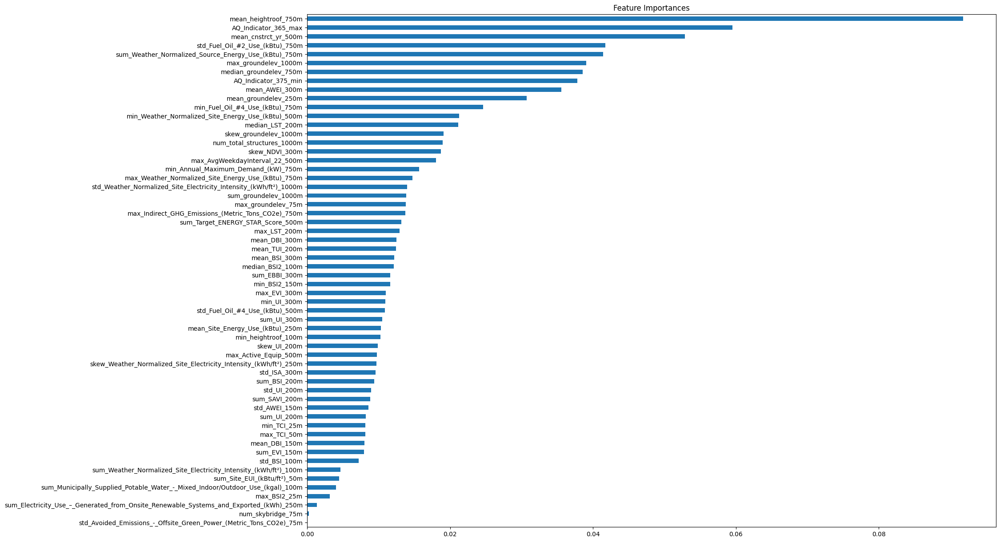

In [75]:
# Despite being potentially deceiving, we can still plot the feature importances of the ensemble model using impurity-based feature importances

sk_imp = pd.Series(model_full.estimators_[0][1].feature_importances_, index=X_test.columns.to_list())

# Plot impurity-based feature importances
plt.figure(figsize=(20, 15))
sk_imp.sort_values().plot(kind="barh")
plt.title("Feature Importances")
plt.show()

In the following, we use SHAP values to inspect the relationship between target and features:

In [76]:
explainer = shap.TreeExplainer(model_full.estimators_[0][1])
shap_values = explainer(X_test)

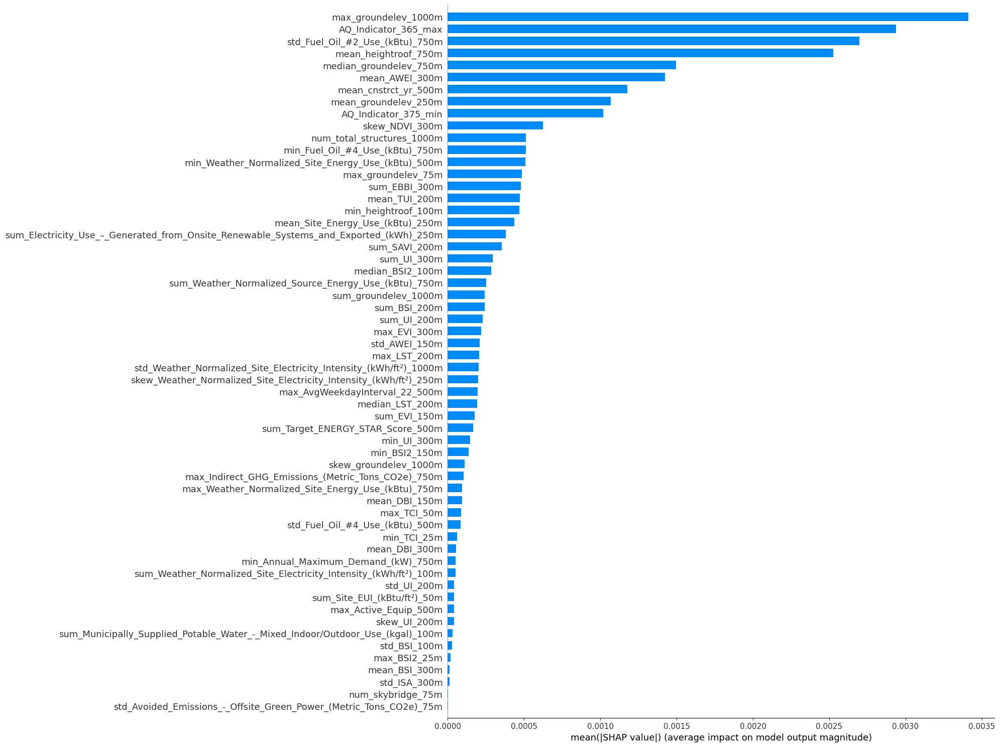

In [95]:
shap.summary_plot(shap_values, X_test, plot_type="bar", max_display=60, plot_size=(20, 15));

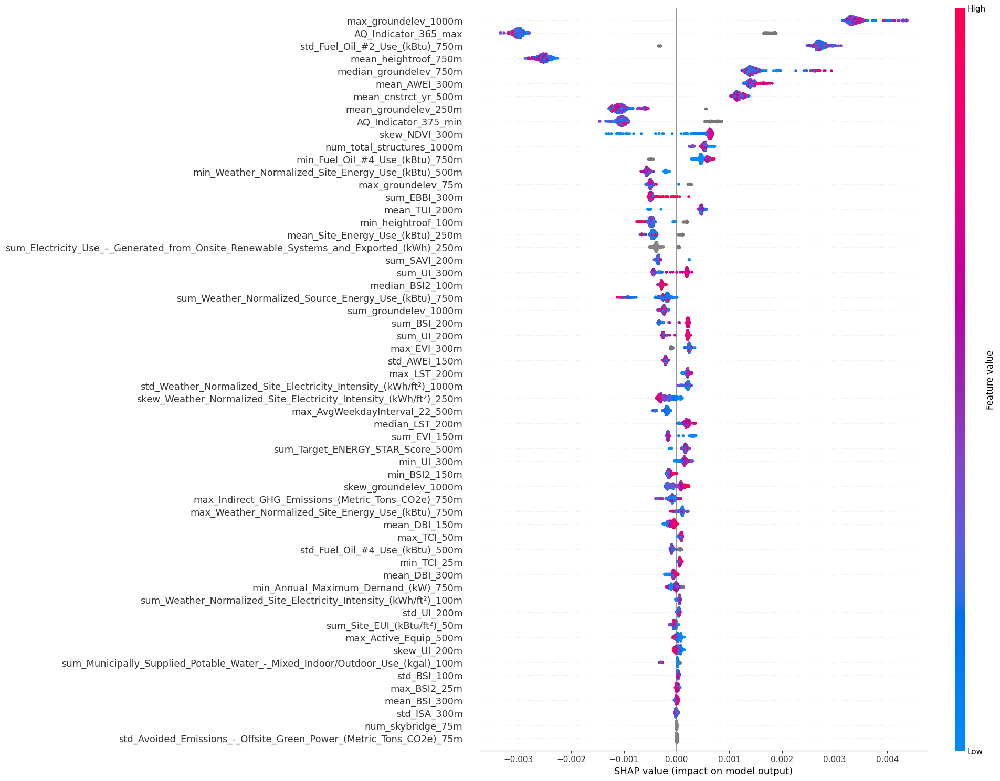

In [101]:
shap.summary_plot(shap_values, X_test, plot_type="dot", max_display=60, plot_size=(20, 15));

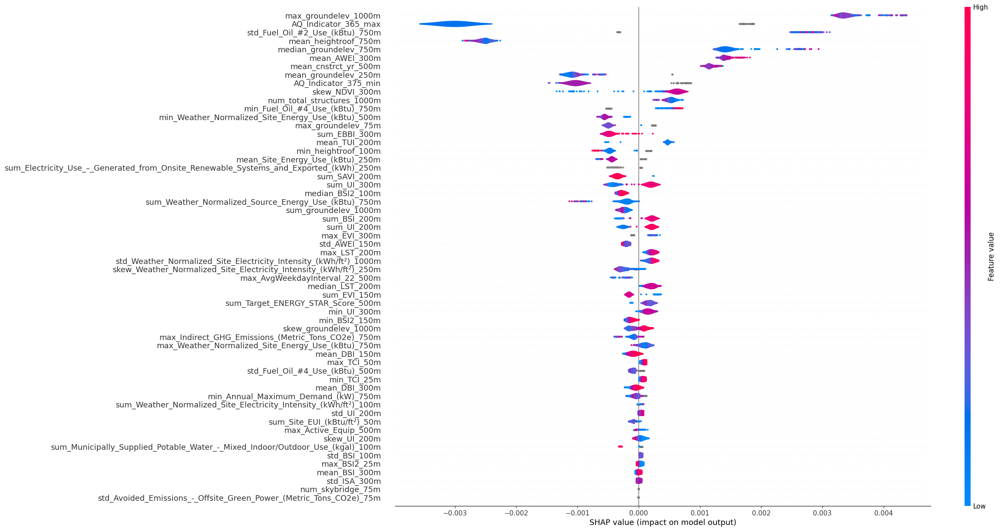

In [97]:
# Using violin plots, we see how each feature impacts predictions as well as the distribution of the feature itself
shap.plots.violin(shap_values, max_display=60, plot_size=(20, 15));

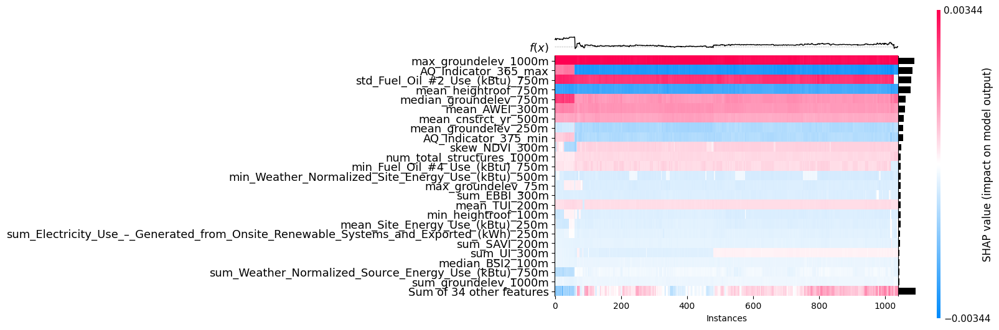

In [100]:
# Using a heatmap, we can see how each feature impacts predictions for each sample
shap.plots.heatmap(shap_values, max_display=25);

Based on the overview visualizations of SHAP values as well as impurity-based importances, we can observe the following interesting trends:

> Please Note: Other features definitely also affect predictions (as one can see from the provided plots), however we try to focus on the most impactful here and describe their implications!

- **AirQuality Indicator 365** in a CD has a strong impact on our UHI Index prediction. More specifically, a lower average concentration of fine particulate matter (PM₂.₅) in micrograms per cubic meter (µg/m³) (Indicator 365) reduces the UHI Index value, while a higher value increases the UHI Index. This makes sense, since more fine particles usually indicate regions such as busy crossroads or industrial plants for example and appears to be in line with our earlier hypothesis.
- Similarly, **AirQuality Indicator 375** in a CD has a proportional relationship with UHI Index values. More specifically, a higher average concentration of nitrogen dioxide (NO₂) in parts per billion (ppb) (Indicator 375) increases the UHI Index value, while a lower value decreases the UHI Index. It is well known that increased nitrogen dioxide concentrations in the air are unhealthy for humans - and they seem to be a good indicator of UHI as well!
- The **number of total structures** in a radius of 1 km also has a very strong relationship to UHI Index values. More specifically, the higher the number of sourrounding buildings (so building density), the higher the predicted UHI Index value is. Lower building density leads to lower UHI Index values.
- The mean **rooftop height** of buildings in a radius of 750 meters is almost directly proportional with the UHI Index values. Taller buildings appear to lead to higher UHI Index values, indicating heat buildup in regions with tall buildings while cities are able to cool down in regions with less skyscrapers/ tall buildings.
- Across multiple aggregations and buffer distances, a higher **groundelevation** of buildings appears to relate to higher UHI Index values. While possible that there is a direct relationship, we believe this feature is being used for local context by the model rather than a individual predictor. Since this value is also usually positive, it is more realistic that it serves as "context".
- **Fuel and Oil consumption of buildings** has a direct relationship to UHI Index values. The more fuel and oil a building uses, the higher its UHI effect is.
- The **Satellite features LST, EBBI, AWEI, and NDVI** stand out as important predictors being used. We will visualize these indices below and analyze them further.

Land Surface Temperature (LST) gives our model temperature data based on satellite band lwir11, therefore fulfilling the earlier explained local dimension which we were not able to map using weather station data. Through this index, our model is able to identify and learn regions which are typically warmer than others. We find that higher LST values also lead to a larger UHI Index value.

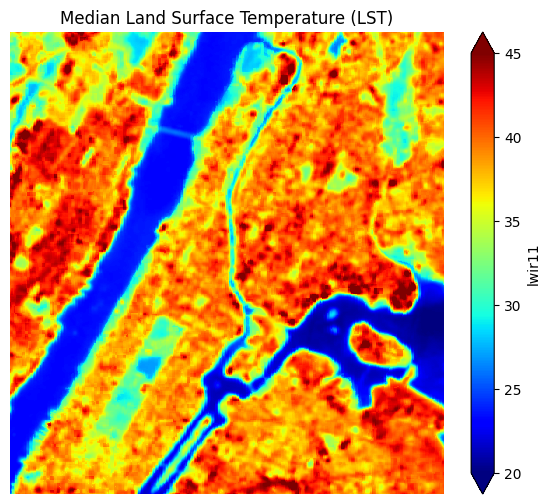

In [81]:
# Calculate LST for median composite
lst_median = landsat_median.lwir11

# Plot LST
fig, ax = plt.subplots(figsize=(7,6))
lst_median.plot.imshow(vmin=20.0, vmax=45.0, cmap="jet")
plt.title("Median Land Surface Temperature (LST)")
plt.axis("off")
plt.show()

Enhanced Built-Up and Bareness Index (EBBI) is a more reliable index than NDBI for distinguishing bare land from built-up areas, as it incorporates thermal properties (SWIR and Red reflectance) to reduce misclassification of dry soil and improve accuracy in arid and mixed land-use regions. This helps our model distinguish between urban areas such as dense buildings or parking lots and more open, bare land regions, such as parks or forests. We can observe that higher EBBI values lead to increased UHI Index values, indicating that urban areas such as buildings and concrete covered areas increase UHI Index values.

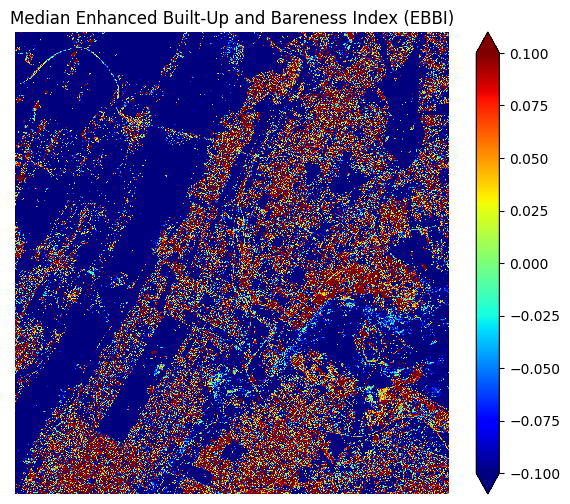

In [82]:
# Calculate EBBI for median composite
ebbi_median = (sentinel_median.B12 - sentinel_median.B08) / (sentinel_median.B12 + 10 * (sentinel_median.B04 ** 0.5))

# Plot EBBI
fig, ax = plt.subplots(figsize=(7,6))
ebbi_median.plot.imshow(vmin=-0.1, vmax=0.1, cmap="jet")
plt.title("Median Enhanced Built-Up and Bareness Index (EBBI)")
plt.axis('off')
plt.show()

AWEI is a more robust water index than traditional methods, as it enhances water body detection by minimizing misclassification caused by shadows, vegetation, and built-up areas. By incorporating a weighted combination of visible, NIR, and SWIR bands, AWEI effectively distinguishes water from non-water surfaces. This index allows our model to more easily detect areas of water. In combination with other features, this index helps the model predict UHIs.

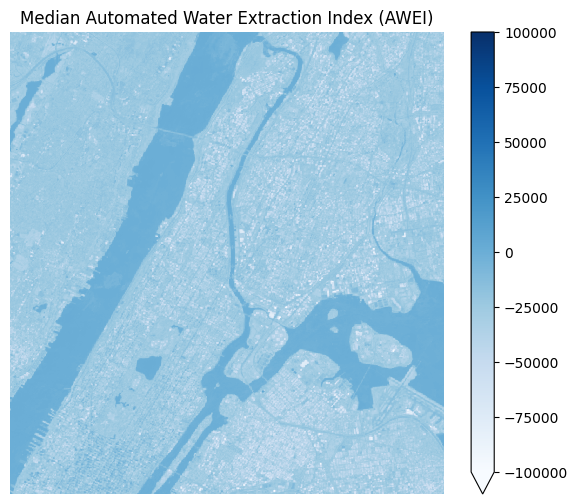

In [83]:
# Calculate AWEI for the median composite
awei_median = 4 * ((sentinel_median.B03 - sentinel_median.B12) - (0.25 * sentinel_median.B08 + 2.75 * sentinel_median.B11))

# Plot AWEI
fig, ax = plt.subplots(figsize=(7,6))
awei_median.plot.imshow(vmin=-100_000.0, vmax=100_000.0, cmap="Blues")
plt.title("Median Automated Water Extraction Index (AWEI)")
plt.axis('off')
plt.show()

Normalized Difference Vegetation Index (NDVI) is a widely used vegetation index that measures plant health and density by analyzing the difference between NIR and Red reflectance. Higher NDVI values indicate healthier, denser vegetation, while lower values signify sparse or stressed vegetation. This index allows our model to more easily detect areas of vegetation. In combination with other features, this index helps the model predict UHIs.

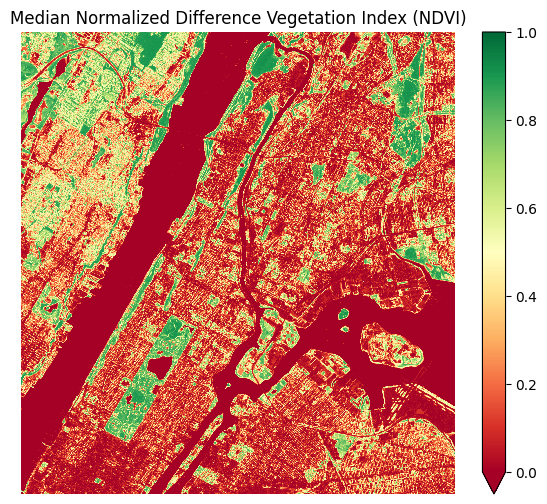

In [84]:
# Calculate NDVI for the median composite
ndvi_median = (sentinel_median.B08-sentinel_median.B04)/(sentinel_median.B08+sentinel_median.B04)

# Plot NDVI
fig, ax = plt.subplots(figsize=(7,6))
ndvi_median.plot.imshow(vmin=0.0, vmax=1.0, cmap="RdYlGn")
plt.title("Median Normalized Difference Vegetation Index (NDVI)")
plt.axis('off')
plt.show()

Lastly, we now inspect some singular predictions that were made on the test set and how these are affected by the different features. Using the interactive visualizations, one can see that feature importances are not one static element of machine learning models. Depending on the input values, different features impact the final prediction heavier than others:

> Note: The below plotscan show values of 0 on the bar´s. This is merely due to our target variable usually varying between 0.95 and 1.05. The order of magnitude the SHAP values as well as our features move in is therefore often close to 0. This is merely the effect of rounding and should not be the focus of the visualizations.

In [85]:
shap.plots.force(shap_values[47])

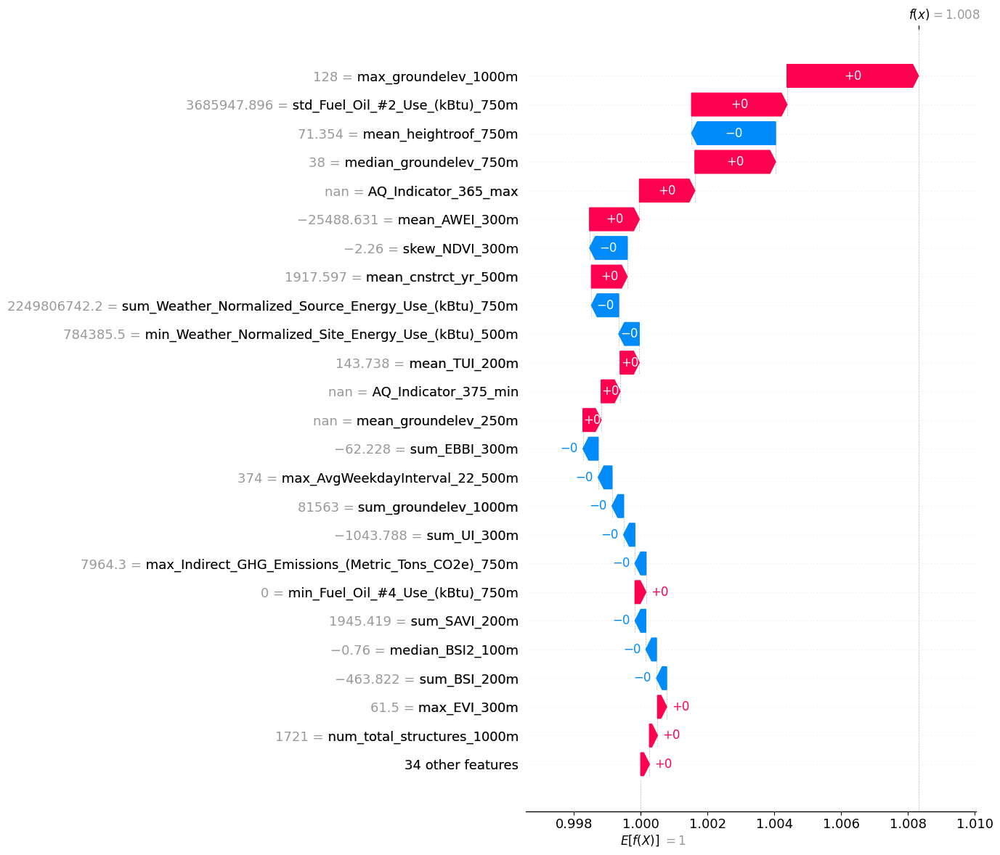

In [86]:
shap.plots.waterfall(shap_values[47], max_display=25)

In [87]:
shap.plots.force(shap_values[490])

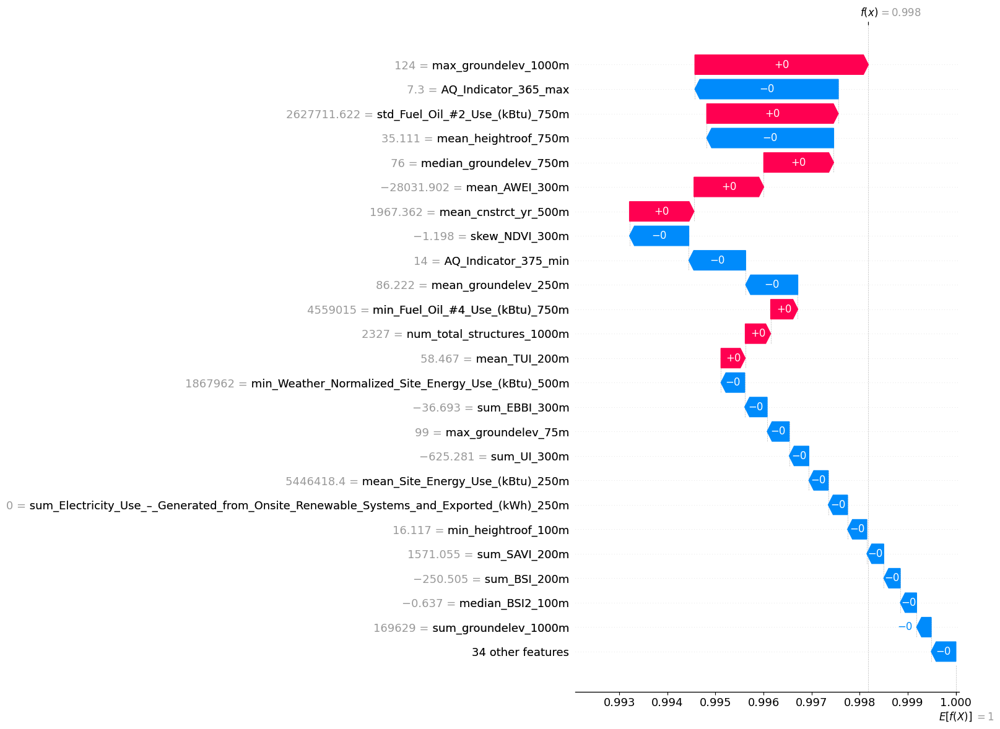

In [88]:
shap.plots.waterfall(shap_values[490], max_display=25)

In [89]:
shap.plots.force(shap_values[0])

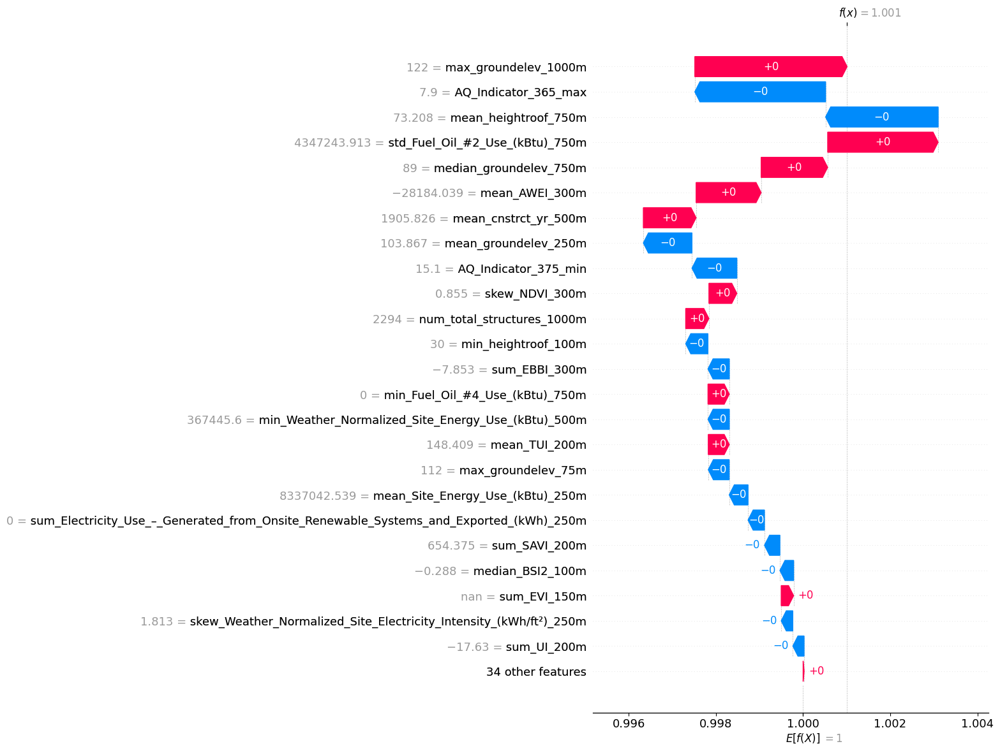

In [90]:
shap.plots.waterfall(shap_values[0], max_display=25)

Thank you for taking the time to read my solution explanation. If you have any questions or are experiencing technical issues evaluating this notebook, please do not hesitate to contact me. 

Kind regards,<br>John